# Import

File written by Ari Sinervo

In [9]:
import numpy as np                                                    # Packages for data analysis
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch, Circle
from scipy.ndimage import gaussian_filter1d
import braingeneers                                                   # Braingeneers code
from braingeneers.analysis.analysis import SpikeData, read_phy_files, burst_detection
import braingeneers.data.datasets_electrophysiology as ephys
import ipywidgets as ipw
from ipywidgets import interact, interactive, fixed, interact_manual  # package for interactive widgets from IPython.display import HTML, display, Javascript, clear_output,
from IPython.display import HTML, display, Javascript, clear_output

Load data:

In [40]:
def loadData(dataset_num):
    global dataset; global cur_data; 
    
    print(f"loading data for dataset {str(dataset_num)}")        # Set global variables used by later functions
    dataset = dataset_num
    cur_data = read_phy_files(f'../data/ephys/2023-04-02-hc328_rec/derived/kilosort2/2023_04_02_hc328_{str(dataset)}_curated.zip')
    print("done")

In [10]:
#cur_data = read_phy_files('../data/ephys/2023-04-02-hc328_rec/derived/kilosort2/2023_04_02_hc328_6_curated.zip')
#cur_data = read_phy_files(f"./data/curated/grp6_after.zip")

In [11]:
metadata = ephys.load_metadata('2023-04-02-hc328_rec')

Set color map for all plots in the notebook:

In [12]:
plot_color = "magma" # default "viridis"

other color schecmes can be found at https://matplotlib.org/stable/tutorials/colors/colormaps.html

# Functions

Base functions for notebook

In [13]:
def correlation(sd):
    # Correlation
    corr = np.zeros((sd.N,sd.N)) #inds by inds
    
    dense_raster = sd.raster(bin_size=1) # in ms
    sigma = 5                            # Blur it
    dense_raster = gaussian_filter1d(dense_raster.astype(float),sigma=sigma)
    corr=np.corrcoef( dense_raster )
        
    return corr;
    
def plot_raster(sd):
    idces, times = sd.idces_times()
    fig, ax = plt.subplots()

    ax.scatter(times/1000,idces,marker='|',s=1)
    ax.set_xlabel("Time(s)")
    ax.set_ylabel('Unit #')
    plt.show()

def raster_analysis(sd, seconds=20):
    # Zoomed Raster and pop rate
    # Get coordinates for raster
    idces, times = sd.idces_times()

    # Get population rate for everything
    pop_rate = sd.binned(bin_size=1)# in ms
    # Lets smooth this to make it neater
    sigma = 5
    pop_rate_smooth = gaussian_filter1d(pop_rate.astype(float),sigma=sigma) 
    t = np.linspace(0,sd.length,pop_rate.shape[0])/1000

    fig, ax = plt.subplots()

    ax.scatter(times/1000,idces,marker='|',s=1)
    ax2 = ax.twinx()
    ax2.plot(t,pop_rate_smooth,c='r')

    ax.set_xlim(0,seconds)
    ax.set_xlabel("Time(s)")
    ax.set_ylabel('Unit #')
    ax2.set_ylabel('Firing Rate')
    plt.show()

def interspike(sd):
    # Interspike-intervals of 2 select neurons
    isis_raw = sd.interspike_intervals()
    # Remove all isi's greater than 100ms. As there are likely neurons not following periodic firing pattern
    isis=[]
    for i in range(len(isis_raw)):   
        isi=isis_raw[i]
        isis = isis + isi[isi<100].tolist() 
        
    # Plot the isi's
    plt.xlim(0,100)
    plt.hist(isis, bins=50)
    plt.xlabel('Time bin(ms)')
    plt.ylabel('ISI count')
    plt.show()

def electrodeLayout():
    x = electrode_mapping.x.values
    y = electrode_mapping.y.values

    plt.scatter(x,y,s=2)
    plt.xlabel('um')
    plt.ylabel('um')
    plt.title("electrode layout")
    plt.show()
    
def neuronLayout(sd):
    #x = electrode_mapping.x.values
    #y = electrode_mapping.y.values

    #plt.scatter(x,y,s=2)

    neuron_x = []
    neuron_y = []
    neuron_amp = []
    for neuron in sd.neuron_data[0].values():
    #     print("x,y:",neuron['position'])
        neuron_x.append(neuron['position'][0])

        neuron_y.append(neuron['position'][1])
        neuron_amp.append(np.mean(neuron['amplitudes']))

    # 
    plt.scatter(neuron_x,neuron_y,s=neuron_amp,c='r')


    plt.xlabel('um')
    plt.ylabel('um')
    plt.title("Neuron layout")
    plt.show()

def sttcLayout(sd, threshold):
    # Lets bring back our graph, and overlay these as connectivity lines

    sttc = sd.spike_time_tilings()
    # electrodes
    #x = electrode_mapping.x.values
    #y = electrode_mapping.y.values
    neuron_x = []
    neuron_y = []
    neuron_amp = []
    for neuron in sd.neuron_data[0].values():
        #     print("x,y:",neuron['position'])
        neuron_x.append(neuron['position'][0])
        neuron_y.append(neuron['position'][1])
        neuron_amp.append(np.mean(neuron['amplitudes']))
    
    plt.figure(figsize=(15,6))
    plt.subplot(1, 2, 1)
    #plt.scatter(x,y,s=2)
    # Neurons
    plt.scatter(neuron_x,neuron_y,s=neuron_amp,c='r')

    # Now lines for each neuron if above threshhold
    for i in range(sttc.shape[0]):
        for j in range(sttc.shape[1]):

            # Only need to do upper triangle since sttc' = sttc
            if i<=j: continue

            if sttc[i,j] < threshold : continue

            #Position of neuron i
            ix,iy = sd.neuron_data[0][i]['position']
            jx,jy = sd.neuron_data[0][j]['position']

            # Plot line between the points, linewidth is the sttc
            plt.plot([ix,jx],[iy,jy], linewidth=sttc[i,j],c='k')

    plt.xlabel('um')
    plt.ylabel('um')
    plt.title("electrode layout")
    
    

    plt.subplot(1, 2, 2)
    sttc[sttc<threshold ] = 0
    plt.imshow(sttc,vmin=0,vmax=1)
    plt.colorbar()
    plt.title("Spike Time Tiling")
    plt.show()
    
def eigenvalues_eigenvectors(A):
    W, U = np.linalg.eigh(A)
    # The rank of A can be no greater than the smaller of its
    # dimensions, so cut off the returned values there.
    rank = min(*A.shape)
    U = U[:,-rank:]
    sgn = (-1)**(U[0,:] < 0)
    # Also reverse the order of the eigenvalues because eigh()
    # returns them in ascending order but descending makes more sense.
    return W[-rank:][::-1], (U*sgn[np.newaxis,:])[:, ::-1]

def toeplitz(M):
    K = M.shape[0]
    topz = np.zeros_like(M)
    for i in range(1 - K, K):
        meantopz = np.mean(np.diagonal(M, offset=i))
        topz += np.eye(K, K, k=i) * meantopz
        topz += np.eye(K, K, k=-i) * meantopz
    return topz
        
def get_sttc(sd):
    sttc = sd.spike_time_tilings()
    return sttc

def plot_evalmatrix(A):
    plt.figure(); plt.imshow(A[:,:2*len(A)].T, interpolation='none', cmap=plot_color)
    plt.gca().set_aspect('auto')
    plt.ylabel('Eigenvector Number')
    plt.xlabel('Observation Dimension')
    plt.title('Eigenvectors of Matrix')
    plt.colorbar();
      
def plot_eigen_error(A, B):
    index = 1 + np.arange(len(A))
    plt.semilogy(index, A, label='Correlation')
    plt.plot(index, B, label='STTC')
    plt.xlabel('Index')
    plt.ylabel('Eigenvalue')
    plt.axvline(len(A)+1, ls=':', c='k')
    plt.legend();
   
def plot_basis(A):
    plt.figure()
    for i in range(1):
        if i: plt.xticks([])
        plt.subplot(4, 1, i+1)
        plt.stem(A[:,i])
    plt.xlabel('Observation Dimension')
    plt.suptitle('First Eigenvector')    
    
def reconstruct(W, U, rank):
    Wd = np.diag(W[:rank])
    Ur = U[:, :rank]
    return Ur @ Wd @ Ur.T
    
def reconstruction_errors(A, ranks):
    norm = np.linalg.norm(A)
    W, U = eigenvalues_eigenvectors(A)
    return np.array([
        np.linalg.norm( reconstruct(W, U, rank) - A) / norm
        for rank in ranks])

def closest_value(number):
    closest = 5
    if abs(number - 20) < abs(number - closest):
        closest = 20
    if abs(number - 50) < abs(number - closest):
        closest = 50
    return closest

def toy_plotter(sd, threshold):
    # Lets bring back our graph, and overlay these as connectivity lines

    sttc = sd.spike_time_tilings()
    # electrodes
    #x = electrode_mapping.x.values
    #y = electrode_mapping.y.values
    neuron_x = []
    neuron_y = []
    neuron_amp = []
    for neuron in sd.neuron_data[0].values():
        #     print("x,y:",neuron['position'])
        neuron_x.append(neuron['position'][0])
        neuron_y.append(neuron['position'][1])
        neuron_amp.append(np.mean(neuron['amplitudes']))
    
    plt.figure(figsize=(15,6))
    plt.subplot(1, 2, 1)
    #plt.scatter(x,y,s=2)
    # Neurons
    plt.scatter(neuron_x,neuron_y,s=neuron_amp,c='r')

    # Now lines for each neuron if above threshhold
    for i in range(sttc.shape[0]):
        for j in range(sttc.shape[1]):

            # Only need to do upper triangle since sttc' = sttc
            if i<=j: continue

            if sttc[i,j] < threshold : continue

            #Position of neuron i
            ix,iy = sd.neuron_data[0][i]['position']
            jx,jy = sd.neuron_data[0][j]['position']

            # Plot line between the points, linewidth is the sttc
            plt.plot([ix,jx],[iy,jy], linewidth=sttc[i,j],c='k')

    plt.xlabel('um')
    plt.ylabel('um')
    plt.title("electrode layout")
    plt.show()

# Code

In [14]:
Corr = correlation(cur_data)
STTC = get_sttc(cur_data)
Toep = toeplitz(Corr)

In [15]:
Wcorr, Ucorr = eigenvalues_eigenvectors(Corr)
Wsttc, Usttc = eigenvalues_eigenvectors(STTC)
Wt, Ut= eigenvalues_eigenvectors(Toep)

Here we get the number of neurons deemed "significant" after curation:

In [16]:
NeurDat = cur_data.N
print("Number of significant neurons for the dataset is: {}".format(NeurDat))

Number of significant neurons for the dataset is: 59


We also want to get the length of the recording and the amount of spikes through the whole recording

In [17]:
TimeDat = cur_data.length / 1000
print("The recording is approximately {} seconds long".format(TimeDat))

The recording is approximately 120.0091 seconds long


In [18]:
TrainDat = cur_data.train
SpikesDat = 0

for i in range(len(TrainDat)):
    SpikesDat += len(TrainDat[i])
    
print("There are {} spikes in the recording".format(SpikesDat))

There are 26625 spikes in the recording


We now calculate the average firing rate per neuron for the dataset from the previous values we retrieved, note that this might not be the most accurate/useful representation of the the firing rate due to the optogenetics experiment being conducted on the neuron tissue obviously creating some changes to this. To account for this we will revisit this later with our stiched data sets where hopefully we will be able to find more accurate representations:

In [19]:
frDat = (SpikesDat / TimeDat) / NeurDat
print("The average firing rate for a single neuron in the dataset is {}".format(frDat))

The average firing rate for a single neuron in the dataset is 3.760308063644157


In [20]:
#c_isi_hold = data_control.interspike_intervals()

isi_raw = cur_data.interspike_intervals()
isiDat = []

for i in range(len(isi_raw)):   
        isi = isi_raw[i]
        isiDat = isiDat + isi[isi<100].tolist() 

isi_sd = np.std(np.array(isiDat))
isi_mean = np.mean(np.array(isiDat))

cvDat = isi_sd /isi_mean

print("The Coefficient of Variation for data_control is: {}".format(cvDat))

The Coefficient of Variation for data_control is: 1.0110869937831166


In [21]:
TrainDat

[array([3.2850000e+01, 6.1400000e+01, 8.1150000e+01, ..., 1.1993215e+05,
        1.1995670e+05, 1.1997525e+05]),
 array([   746.75,   1030.25,   1966.  ,   2193.2 ,   2937.55,   3033.75,
          3189.6 ,   3437.25,   3734.8 ,   4328.8 ,   4574.05,   4910.  ,
          4932.45,   5274.3 ,   5488.7 ,   5869.7 ,   6056.3 ,   6299.55,
          6592.8 ,   6839.7 ,   7291.4 ,   7685.9 ,   8312.1 ,   8922.65,
          9023.3 ,   9301.6 ,   9617.85,   9687.55,   9881.75,  10129.35,
         10629.4 ,  11003.45,  12404.45,  12894.75,  13160.  ,  13264.25,
         13435.8 ,  13646.15,  13804.05,  14118.05,  14317.3 ,  14591.1 ,
         15367.9 ,  15487.05,  15504.35,  15871.55,  16046.2 ,  16184.25,
         16234.4 ,  16378.45,  16574.1 ,  17066.95,  17277.8 ,  17368.85,
         17622.15,  17723.05,  18510.8 ,  18771.85,  18991.85,  19122.65,
         20400.2 ,  20573.15,  20862.85,  20905.95,  21554.75,  22278.  ,
         22544.3 ,  22824.1 ,  22855.55,  22877.35,  22890.25,  22898.6 ,

In [22]:
len(TrainDat)

59

For later use in creating the stiched datasets we're creating an array "spikes-per-second" or sps which is the amount of firings in each neruon for millisecond of the recording:

TypeError: array() missing required argument 'object' (pos 0)

### ISI Histogram 

Here we plot the interspike intervals in a histogram

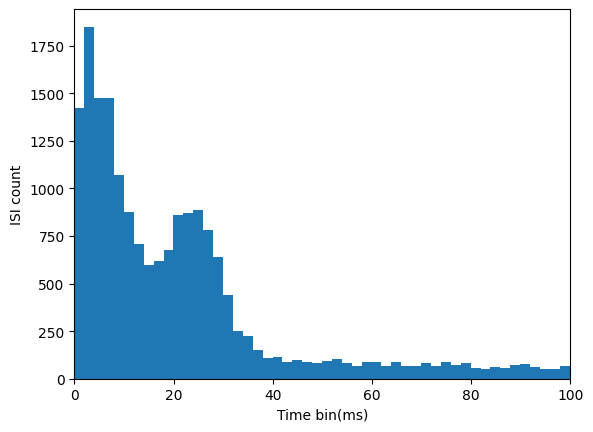

In [33]:
interspike(cur_data)

### Plotting Spike Rasters

Here we plot the raster for the recording. We also can analyze the spikes in these recordings.

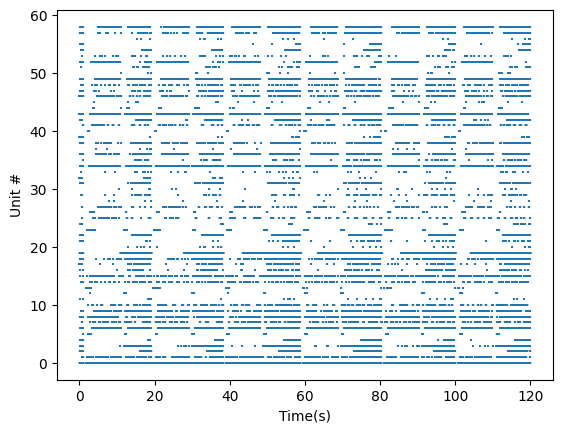

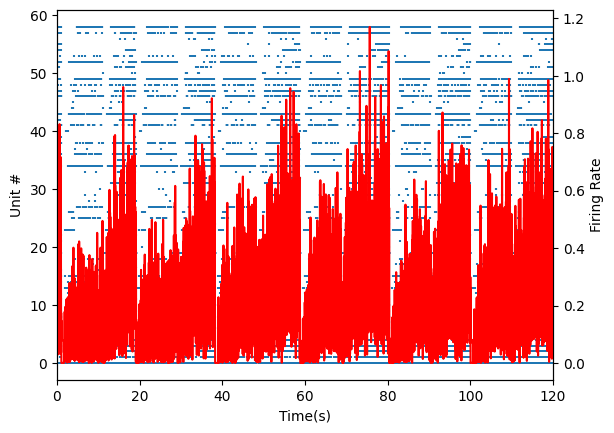

In [34]:
plot_raster(cur_data)
raster_analysis(cur_data, TimeDat)

### Plotting Correlation & STTC

Here we plot the matrices for Correlation and STTC, these are a representation of what neurons are correlated with other neurons. Note that the matrix is symmetrical, this is because each axis is every neuron in the sampleset and the row/columns of the matrix are which neuron that row/column's correlates with. 

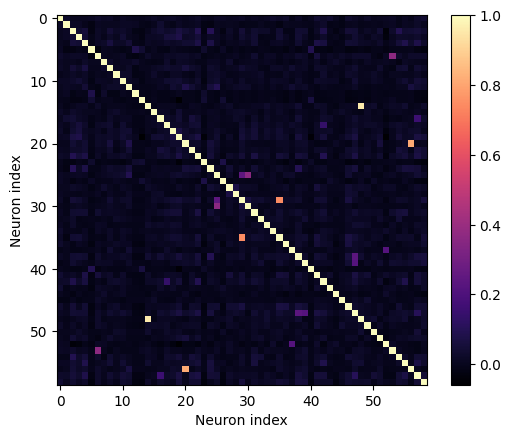

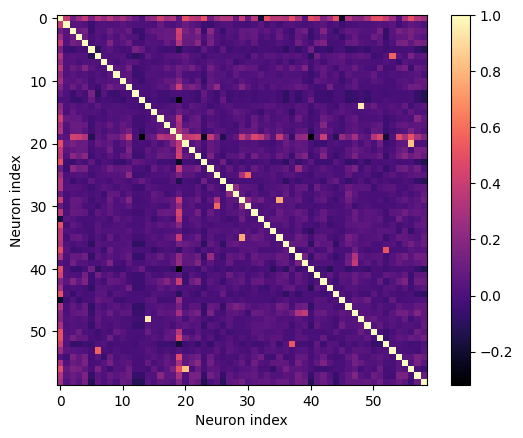

In [41]:
plt.imshow(Corr, cmap=plot_color) # plot correlation matrix
plt.xlabel("Neuron index")
plt.ylabel("Neuron index")
plt.colorbar()
plt.show() 

plt.imshow(STTC, cmap=plot_color) # plot STTC matrix
plt.xlabel("Neuron index")
plt.ylabel("Neuron index")
plt.colorbar()
plt.show() 

### Electrode/Neuron Layout 

Here we plot the layout of neurons on the array

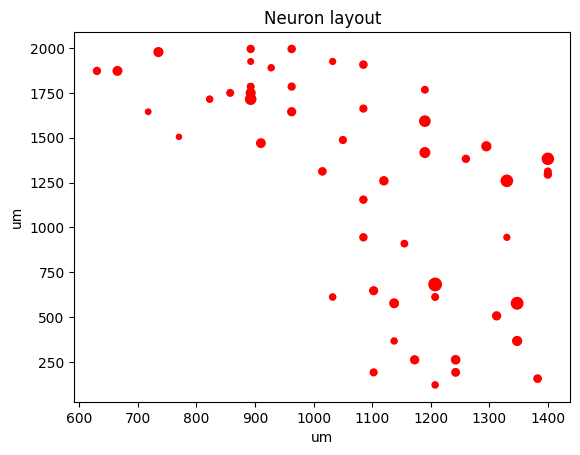

In [36]:
neuronLayout(cur_data)

We can make the same plot with connectivity lines between each neuron in the sampleset. These connectivity lines show correlation between their firings and are drawn using the STTC correlation method. This is essentially a different way to represent the STTC matrix from the previous section. 

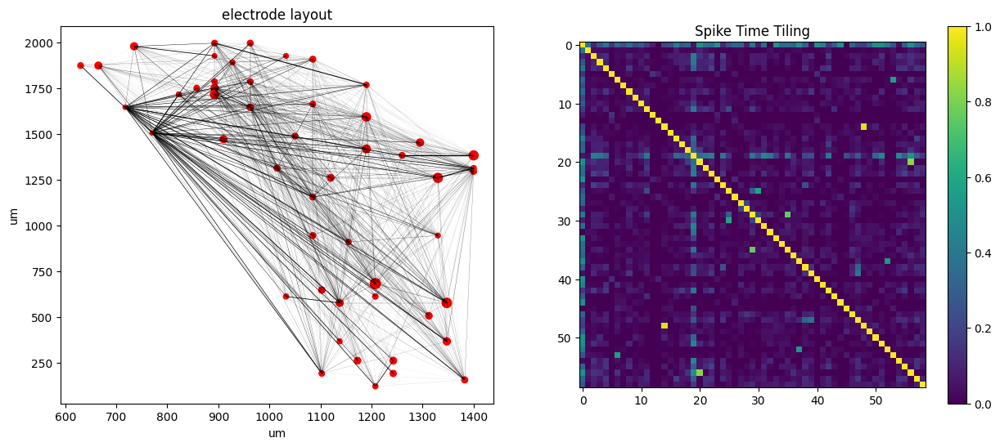

In [37]:
sttcLayout(cur_data, 0)

### Plotting Eigenvalue Matrices for Datasets

Here we plot the eigenvectors, dirived from each method's matrix, in matrix form:

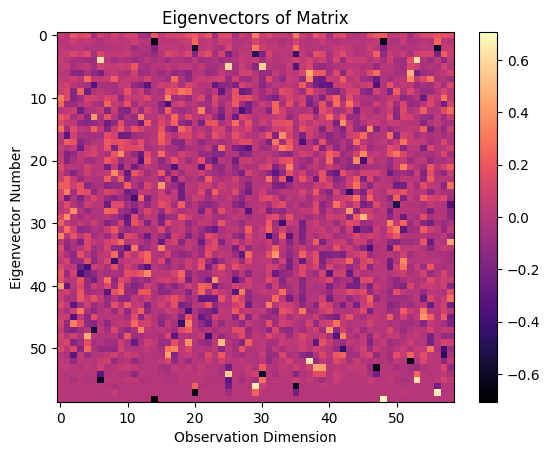

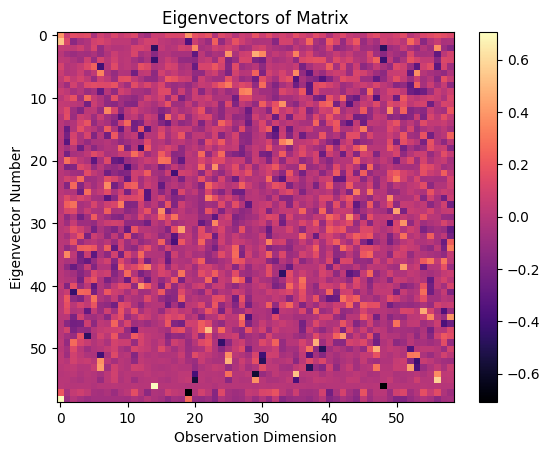

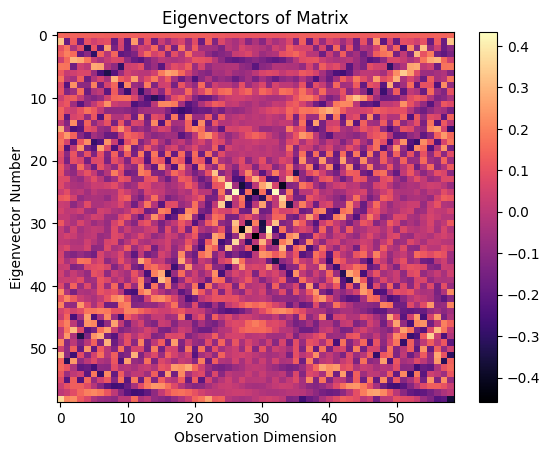

In [46]:
plot_evalmatrix(Ucorr)  # Correlation
plot_evalmatrix(Usttc)  # STTC
plot_evalmatrix(Ut)     # Toeplitz

We can also plot the first eigenvector of these methods (this is the same as the first row of the previous matrix, consider this essentially zooming in)

In [ ]:
plot_basis(Ucorr)   # Correlation
plot_basis(Usttc)   # STTC
plot_basis(Ut)      # Toeplitz 

Here we plot the sepctrum (range/significance) of the eigen values derrived from each method, note that STTC has greater significance for the first few values than correlation

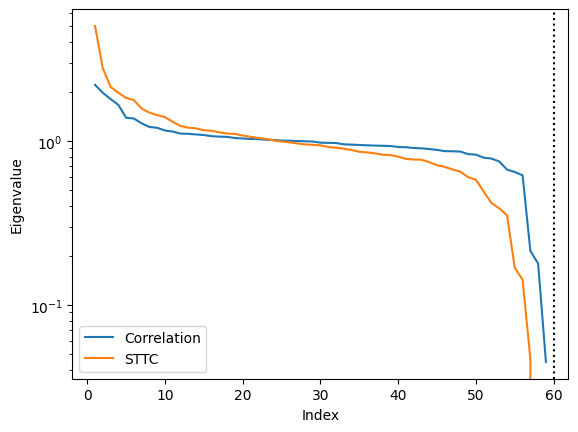

In [38]:
plot_eigen_error(Wcorr, Wsttc)

Here we plot the error for the reconstructed matrix as we use more eigenvectors in the reconstruction. Note that just like how STTC has more significant eigenvalues, the reconstruction error is consistently lower for STTC than correlation. 

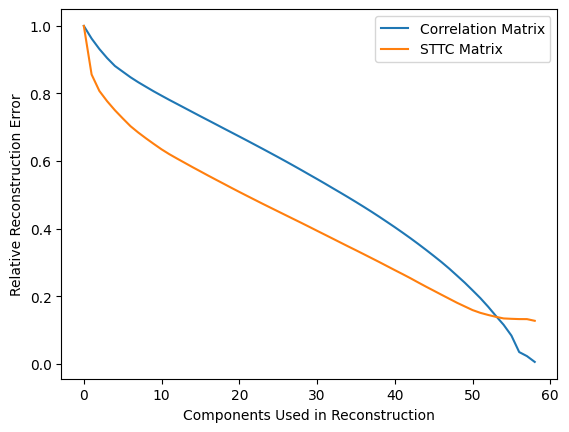

In [39]:
errs_corr = reconstruction_errors(Corr, range(len(Corr)))      # Correlation
errs_sttc = reconstruction_errors(STTC , range(len(STTC)))     # STTC   
#errs_top = reconstruction_errors(Toep, range(len(Toep)))      # Toeplitz


plt.figure()
plt.plot(errs_corr, label='Correlation Matrix')                # Correlation
plt.plot(errs_sttc, label='STTC Matrix')                       # STTC
#plt.plot(errs_top, label='Toeplitz Matrix')                   # Toeplitz
plt.xlabel('Components Used in Reconstruction')
plt.ylabel('Relative Reconstruction Error')
plt.legend();

### Eigenvector Layout <Font color = "red"> (In Progress) 

Here we plot the first eigenvector on the neuron layout we did before

In [42]:
def evectLayout(sd,vect, threshold=0):
    #x = electrode_mapping.x.values
    #y = electrode_mapping.y.values

    sttc = sd.spike_time_tilings()
    
    neuron_x = []
    neuron_y = []
    neuron_amp = []
    for neuron in sd.neuron_data[0].values(): # Plots neurons on a 2-d space, representing their positions on the array
    #     print("x,y:",neuron['position'])
        neuron_x.append(neuron['position'][0])

        neuron_y.append(neuron['position'][1])
        neuron_amp.append(np.mean(neuron['amplitudes']))

    # 
    plt.scatter(neuron_x,neuron_y, s=neuron_amp, c=vect, cmap = plot_color) # color each plotted neuron according to the values of the eigenvector

    for i in range(sttc.shape[0]): # plot connectivity lines between neurons
        for j in range(sttc.shape[1]):

            # Only need to do upper triangle since sttc' = sttc
            if i<=j: continue

            if sttc[i,j] < threshold : continue

            #Position of neuron i
            ix,iy = sd.neuron_data[0][i]['position']
            jx,jy = sd.neuron_data[0][j]['position']

            # Plot line between the points, linewidth is the sttc
            plt.plot([ix,jx],[iy,jy], linewidth=sttc[i,j],c='k')
            
    plt.xlabel('um')
    plt.ylabel('um')
    plt.title("Neuron layout")
    plt.colorbar()
    plt.show()

Get the first eigenvector of correlation and STTC

In [43]:
Pcorr = Ucorr[1].tolist() # First Eigenvector of Correlation
Psttc = Usttc[1].tolist() # First Eigenvector of STTC

print(Pcorr)
print(Psttc)

[0.015147482673970036, 0.012520880262083048, -0.0008046392281807202, 0.056519966709717984, 0.00441541765971179, 0.053105814194429626, -0.008098703610332256, 0.02089282806881855, 0.09920437518840527, 0.11757503431265036, 0.14269335833876257, -0.09063622923475358, 0.040494176864917936, 0.1226506409391134, 0.04433983291308101, -0.06644680611228417, -0.3199049962403022, 0.22447804906848975, -0.024665678932062236, -0.17907684589738157, -0.1737349743817316, -0.003578480002188196, -0.04839765880352004, 0.20669040422204069, 0.2149618117523603, 0.3141127544967691, -0.23545699357460284, 0.13963998467746297, 0.06451528496034775, 0.37808230164824536, 0.03926660966597696, 0.2770145916257625, -0.010277756728763104, -0.0997105083684881, -0.15387130278827704, -0.030478031057096948, 0.10494328455870378, 0.03490329749161987, -0.10521931016769044, -0.0052715513115451085, -0.2832293230607341, 0.08711052921057205, -0.05306902790848266, 0.030037673184383024, -0.04876803603975361, 0.06632275871263622, -0.141

Plot correlation eigenvector on neuron layout

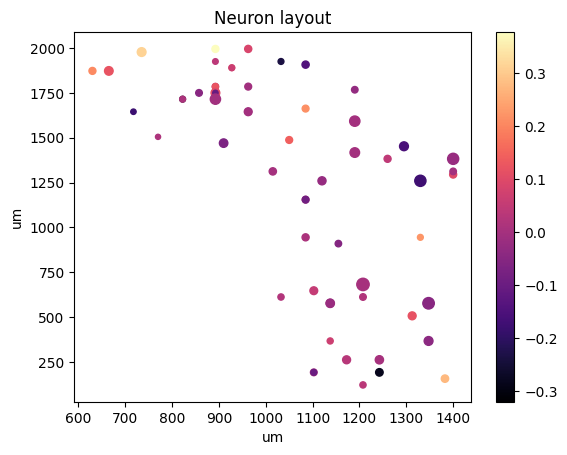

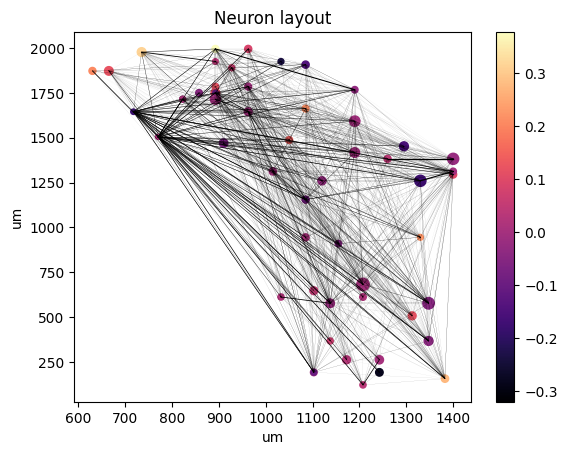

In [44]:
evectLayout(cur_data, Pcorr, 1000) # Print layout without connectivity lines
evectLayout(cur_data, Pcorr)       # Print with

Plot STTC eigenvector on neuron layout

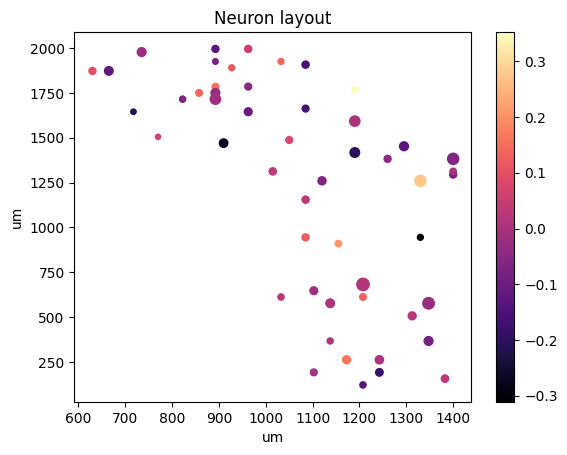

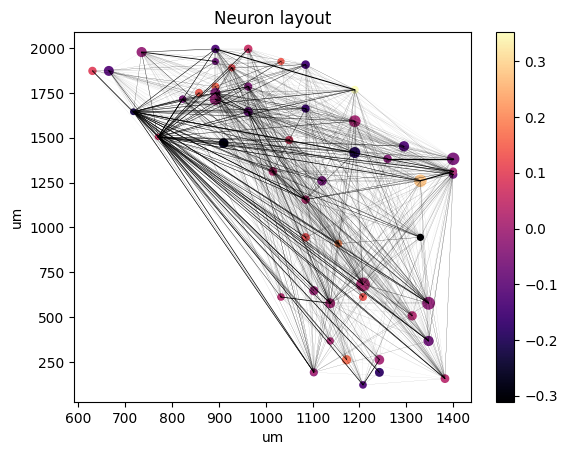

In [45]:
evectLayout(cur_data, Psttc, 1000) # Print layout without connectivity lines
evectLayout(cur_data, Psttc)       # Print with

### PCA Plots

In [ ]:
Ucorr[0] # First eigenvector of corr

In [ ]:
Ucorr[1] # Second eigenvector of corr

Plots PCA chart with first two eigenvectors of corr and sttc

In [ ]:
plt.scatter(Ucorr[0], Ucorr[1]) # first two eigenvectors of correlation 
plt.scatter(Usttc[0], Usttc[1]) # first two eigenvectors of STTC
plt.legend(["Correlation Eigenvectors", "STTC Eigenvectors"])
plt.title("Principle Components Analysis of Correlation Methods")
plt.xlabel("PC1")
plt.ylabel("PC2")

### Stitch <Font color = "red"> (In Progress) 

We seperate the data of the entire recording into smaller sections and make plots from these subsets

In [ ]:
def SubsetPlots(sd, UseSTTC, CoolDown, MaxTime, StartTime=0, Ret=False, Plot=True): 
    # Generates a set of plots based on subsets of a spikedata set, returns subsets if necissisary
        # sd: spikedata set we are working on
        # UseSTTC: correlation method, False for correlation or True for STTC
        # CoolDown: amount of time in milliseconds to split the data 
        # MaxTime: amount of time in seconds to record the data
        # StartTime: amount of time in seconds to start recording from
        # Ret: whether to return subsets or not
        # Plot: whether or not to plot subset data
        
        # Usage: Datasets = SubsetPlots(cur_data, True, 10000, TimeDat, Ret=True, Plot=False)
        #        SubsetPlots(cur_data, True, 10000, TimeDat, StartTime = 10)
        
    Subsets = []
    Time = StartTime * 1000                # Convert StartTime to millisecond
    MilliMaxTime = MaxTime * 1000          # Convert Maxtime to millisecond 
    CounterDiff = 1                        # Counter to differentiate plots (rudementary UI)
    
    while Time < MilliMaxTime:             # Collects subsets of raster and places them in an array
        Subsets.append(sd.subtime(Time, Time + CoolDown))
        Time += CoolDown

    print("There are {} subsets(s)".format(len(Subsets)))
    
    if Plot==True:
        for i in Subsets:
                print("Plots for subset: {}".format(CounterDiff))

                if UseSTTC==True:          # Use STTC version of all these plots
                    CorrMeth = i.spike_time_tilings()
                else:                      # Use Correlation version of all these plots
                    CorrMeth = correlation(i)

                W, U = eigenvalues_eigenvectors(CorrMeth)
                P = U[1].tolist()

                print("Neuron Layout for {}".format(CounterDiff))
                toy_plotter(i, 0.3)        # Functional connectivity

                print("Eigenvector Layout for {}".format(CounterDiff))
                evectLayout(i, P, 1000)    # Eigenvector layout

                print("Basis for {}".format(CounterDiff))
                plot_basis(U)              # First eigenvector "basis"

                print("Eigenvector Matrix for {}".format(CounterDiff))
                plot_evalmatrix(U)         # Eigenvector matrix    

                print("------------------------------------------------------------------------------------------------------\n\n")
                CounterDiff += 1
                       
    if Ret==True:
        return Subsets
    else:
        return

Make plots from subset data:

In [ ]:
SubsetPlots(cur_data, True, 10000, TimeDat)

Get list of subsets "datasets" without plotting anything

In [ ]:
datasets = SubsetPlots(cur_data, True, 10000, TimeDat, Ret=True, Plot=False)

In [ ]:
# print plots --- print raster segment and time interval

def Gif_plotter(sd, threshold):
    sttc = sd.spike_time_tilings()
    # electrodes
    #x = electrode_mapping.x.values
    #y = electrode_mapping.y.values
    neuron_x = []
    neuron_y = []
    neuron_amp = []
    for neuron in sd.neuron_data[0].values():
        #     print("x,y:",neuron['position'])
        neuron_x.append(neuron['position'][0])
        neuron_y.append(neuron['position'][1])
        neuron_amp.append(np.mean(neuron['amplitudes']))
    
    plt.figure(figsize=(15,6))
    plt.subplot(1, 2, 1)
    #plt.scatter(x,y,s=2)
    # Neurons
    plt.scatter(neuron_x,neuron_y,s=neuron_amp,c='r')

    # Now lines for each neuron if above threshhold
    for i in range(sttc.shape[0]):
        for j in range(sttc.shape[1]):

            # Only need to do upper triangle since sttc' = sttc
            if i<=j: continue

            if sttc[i,j] < threshold : continue

            #Position of neuron i
            ix,iy = sd.neuron_data[0][i]['position']
            jx,jy = sd.neuron_data[0][j]['position']

            # Plot line between the points, linewidth is the sttc
            plt.plot([ix,jx],[iy,jy], linewidth=sttc[i,j],c='k')

    plt.xlabel('um')
    plt.ylabel('um')
    plt.title("electrode layout")
    
    
    """fig, ax = plt.subplots()

    ax.scatter(times/1000,idces,marker='|',s=1)
    ax.set_xlabel("Time(s)")
    ax.set_ylabel('Unit #')"""

    plt.subplot(1, 2, 2)
    idces, times = sd.idces_times()
    plt.scatter(times/1000,idces,marker='|',s=1)
    plt.xlabel("Time(s)")
    plt.ylabel('Unit #')
    #plt.colorbar()
    plt.title("Recording Segment")
    plt.show()
    
Gif_plotter(datasets[1], 0.3)

#### Backup Plotters

Plot Rasters (test)

In [ ]:
CounterDiff = 1 
for i in datasets: 
    CorrMeth = i.spike_time_tilings()
    #CorrMeth = correlation(i)
    W, U = eigenvalues_eigenvectors(CorrMeth)
    P = U[1].tolist()
    print("Neuron Layout for {}".format(CounterDiff))
    plot_raster(i)            # Spike Raster
    CounterDiff += 1 

Plot Neuron Layout

In [24]:
CounterDiff = 1 
for i in datasets: 
    CorrMeth = i.spike_time_tilings()
    #CorrMeth = correlation(i)
    W, U = eigenvalues_eigenvectors(CorrMeth)
    P = U[1].tolist()
    print("Neuron Layout for {}".format(CounterDiff))
    toy_plotter(i, 0.3)        # Functional connectivity
    CounterDiff += 1 

NameError: name 'datasets' is not defined

Plot Eigenvector Layout

In [25]:
CounterDiff = 1 
for i in datasets: 
    CorrMeth = i.spike_time_tilings()
    #CorrMeth = correlation(i)
    W, U = eigenvalues_eigenvectors(CorrMeth)
    P = U[1].tolist()
    print("Eigenvector Layout for {}".format(CounterDiff))
    evectLayout(i, P, 1000)    # Eigenvector layout
    CounterDiff += 1 

NameError: name 'datasets' is not defined

Plot Eigenvector Basis

In [26]:
CounterDiff = 1 
for i in datasets: 
    CorrMeth = i.spike_time_tilings()
    #CorrMeth = correlation(i)
    W, U = eigenvalues_eigenvectors(CorrMeth)
    P = U[1].tolist()
    print("Basis for {}".format(CounterDiff))
    plot_basis(U)              # First eigenvector "basis"
    CounterDiff += 1 

NameError: name 'datasets' is not defined

Plot Eigenvector Matrix

In [27]:
CounterDiff = 1 
for i in datasets: 
    CorrMeth = i.spike_time_tilings()
    #CorrMeth = correlation(i)
    W, U = eigenvalues_eigenvectors(CorrMeth)
    P = U[1].tolist()
    print("Eigenvector Matrix for {}".format(CounterDiff))
    plot_evalmatrix(U)         # Eigenvector matrix    
    CounterDiff += 1 

NameError: name 'datasets' is not defined

#### Bunk code (legacy)

In [28]:
idces, times = cur_data.idces_times()
numlist, bursts = burst_detection(times, 10, 3)
raster = cur_data.raster()
print(raster)
times
print(len(numlist))
print(len(bursts))

[[0 1 0 ... 1 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 1 0 0]
 [0 0 1 ... 0 1 0]]
1801
25111


In [29]:
"""def depression_detection(sd, spike_times, dpres_threshold, spike_num_thr=3):
    spike_num_dpres = 1
    spike_num_list = []
    for i in range(len(spike_times)-1):
        if spike_times[i+1] - spike_times[i] <= dpres_threshold:
            spike_num_dpres += 1
        else:
            if spike_num_dpres <= spike_num_thr:
                spike_num_list.append([i-spike_num_dpres+1, spike_num_dpres])
                spike_num_dpres = 1
            else:
                spike_num_dpres = 1
    dpres_set = []
    for loc in spike_num_list:
        for i in range(loc[1]):
            dpres_set.append(spike_times[loc[0]+i])
    return spike_num_list, dpres_set"""

def dataStitch(sd, cooldown = 10000, dpres_threshold = 0, spike_num_thr=3):
    #Stiches data from an SD so that oit returns two datasets of uncontrolled firing and post-light firing
    
    #idces, times = sd.idces_times()
    
    pop_rate = sd.binned(bin_size=1)# in ms
    # Lets smooth this to make it neater
    sigma = 5
    pop_rate_smooth = gaussian_filter1d(pop_rate.astype(float),sigma=sigma) 
    t = np.linspace(0,sd.length,pop_rate.shape[0])/1000
    
    depresses = []
    
    for i in range(len(pop_rate_smooth)):
        if pop_rate_smooth[i] <= dpres_threshold:
            depresses.append(t[i])
    
    print(len(t))
    print(len(depresses))
            
    #spike_nums, depresses = depression_detection(sd, times, dpres_threshold, spike_num_thr)
    #print(depresses)
    
    UcFiring = sd.subtime(0, depresses[0]) #Uncontrolled firing
    PdFiring = sd.subtime(depresses[0], depresses[0] + cooldown) #Post-depression firing
    
    print(UcFiring.length)
    print(PdFiring.length)
    
    for i in range(1, len(depresses)):
        UcFiring.append(sd.subtime(depresses[i - 1] + cooldown, depresses[i]), UcFiring.length)
        PdFiring.append(sd.subtime(depresses[i], depresses[i] + cooldown), PdFiring.length)
    
    return UcFiring, PdFiring

In [30]:
UCF, PDF = dataStitch(cur_data)

120010
3832
1.0890009074319429
10000.0


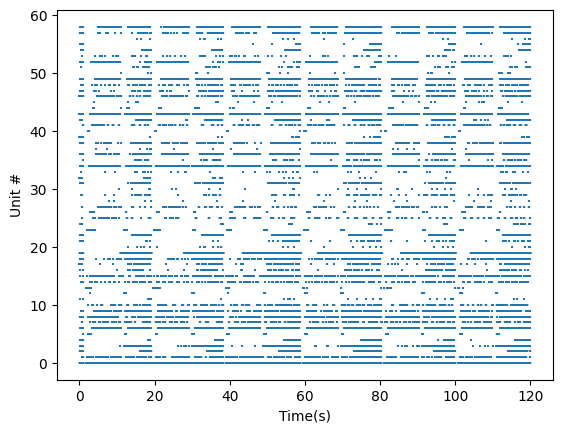

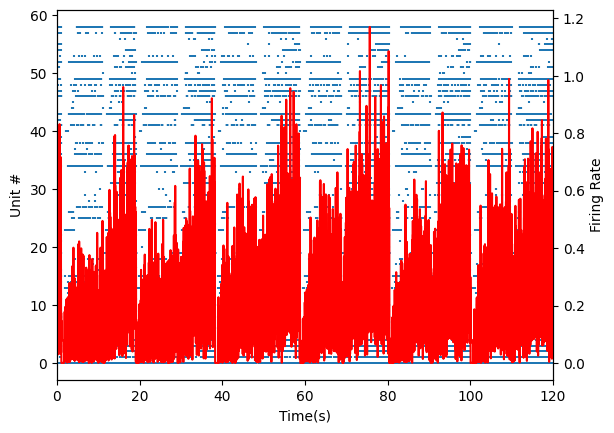

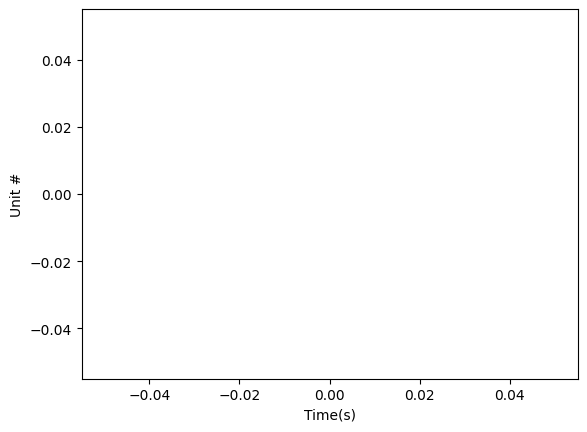

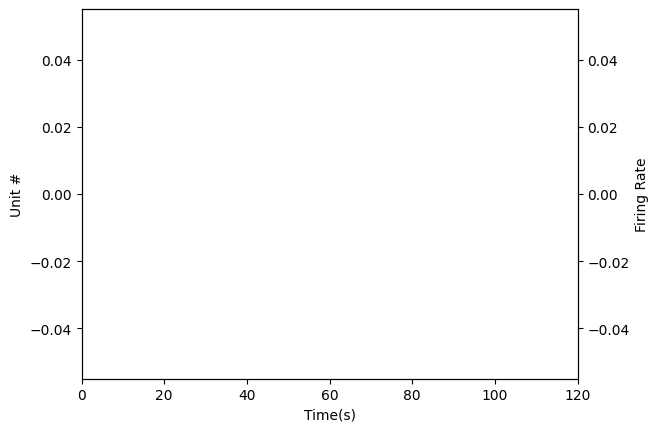

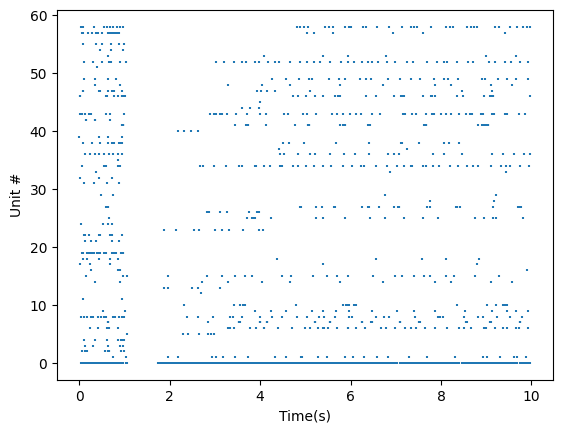

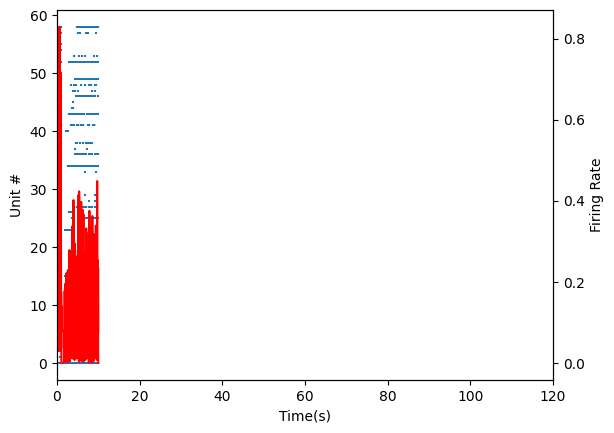

In [31]:
plot_raster(cur_data)
raster_analysis(cur_data, 120)
plot_raster(UCF)
raster_analysis(UCF, 120)
plot_raster(PDF)
raster_analysis(PDF, 120)

### create gif

In [32]:
from images2gif import writeGif
from PIL import Image, ImageDraw
import os
import sys
import random
import argparse
import webbrowser

filename = ""

def makeimages():
    # Create the dir for generated images
    if not os.path.exists("Images"):
        os.makedirs("Images")
    for z in range(1, 31):
        dims = (400, 400)  # size of image
        img = Image.new('RGB', dims)  # crete new image
        draw = ImageDraw.Draw(img)
        r = int(min(*dims)/100)
        print("Image img%d.png has been created" % z)

        n = 1000

        for i in range(n):
            x, y = random.randint(0, dims[0]-r), random.randint(0, dims[1]-r)
            fill = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
            draw.ellipse((x-r, y-r, x+r, y+r), fill)

        img.save('Images/.img%d.png' % z)

def makeAnimatedGif():
    # Recursively list image files and store them in a variable
    path = "./Images/"
    os.chdir(path)
    imgFiles = sorted((fn for fn in os.listdir('.') if fn.endswith('.png')))

    # Grab the images and open them all for editing
    images = [Image.open(fn) for fn in imgFiles]

    global filename
    filename = filename + ".gif"
    writeGif(filename, images, duration=0.2)
    print(os.path.realpath(filename))
    print("%s has been created, I will now attempt to open your" % filename)
    print("default web browser to show the finished animated gif.")
    #webbrowser.open('file://' + os.path.realpath(filename))


def start():
    print("This program will create an animated gif image from the 30 images provided.")
    print("Please enter the name for the animated gif that will be created.")
    global filename
    filename = raw_input("Do Not Use File Extension >> ")
    print("Please wait while I create the images......")
    makeimages()
    print("Creating animated gif....")
    makeAnimatedGif()

start()

ModuleNotFoundError: No module named 'images2gif'

# Saved Results

Here I saved the results of my analysis of the data, here you can find plots for correlation/sttc matrices, spike rasters, neuron count, and ISI histograms for every dataset. Each data set's results are stored int their specific enumerated section (starting 0-7)

## Data Set 0:

We have 55 neurons for data set 0

The recording is approximately 54.8192 seconds long, with a total of 4883 spikes throughout.

The average firing rate for a neuron in the data set is 1.619538741568979 with a cv of 0.7232198548319322. 

### Spike Rasters

looking at the times there seems to be a shutdown in firing around 4 and 9 seconds.

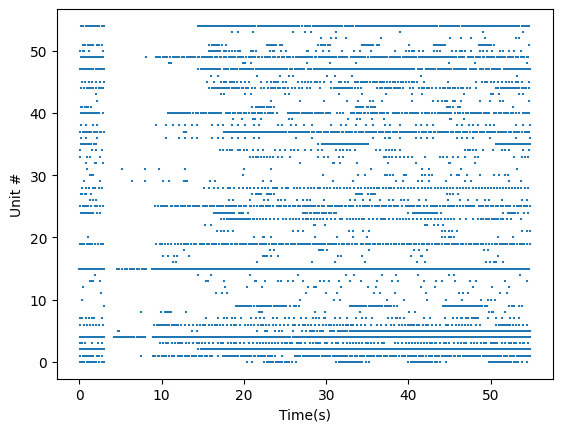
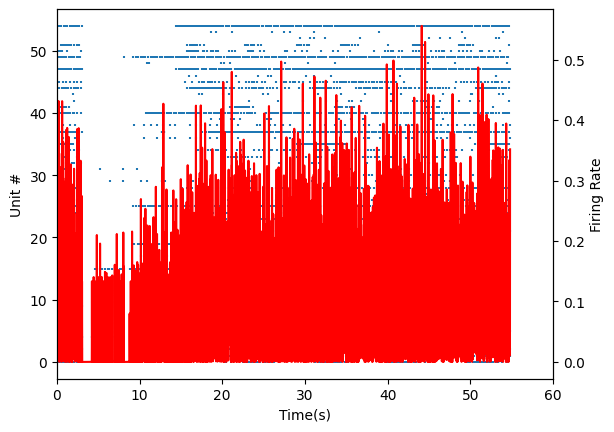
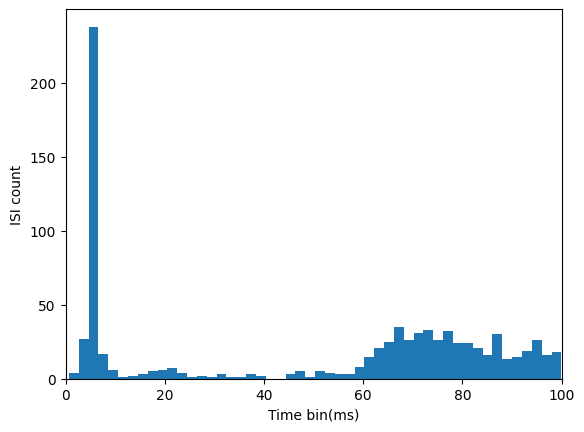

### Correlation and STTC matrices

correlation matrix

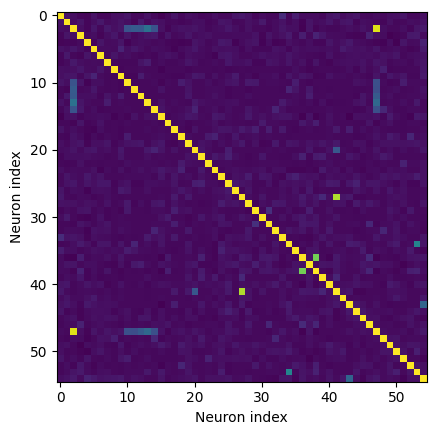

STTC matrix

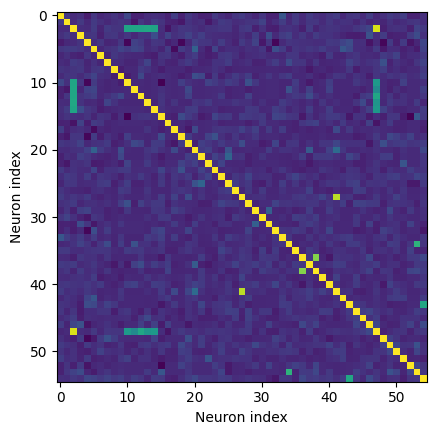

### Neuron Layout

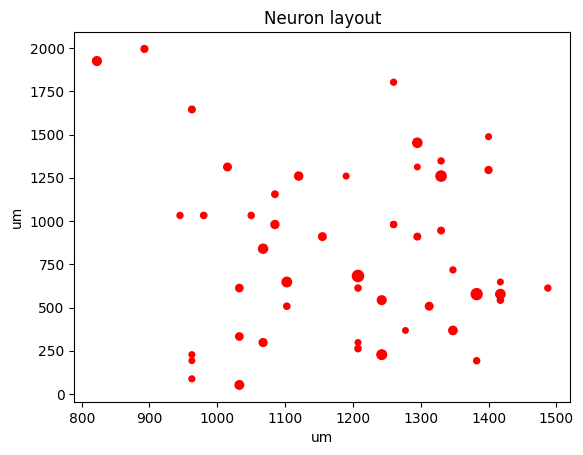

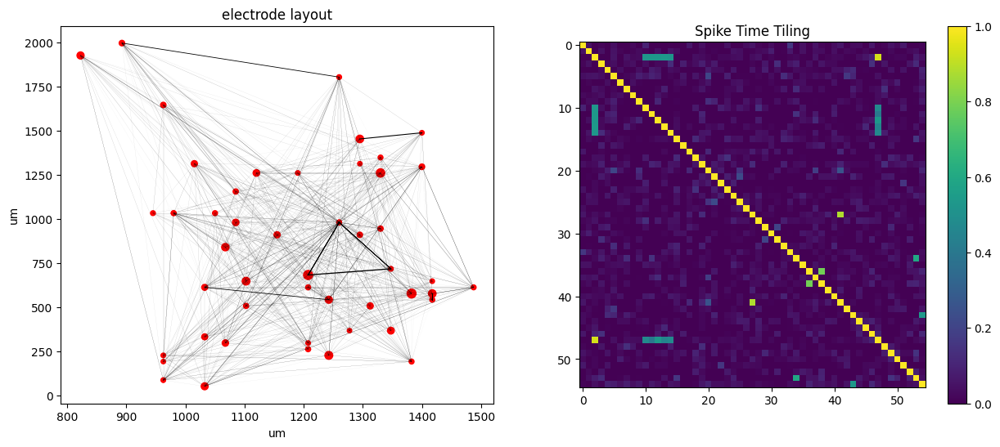

### Egeinvector Analysis

Eigenvectors of the correlation matrix

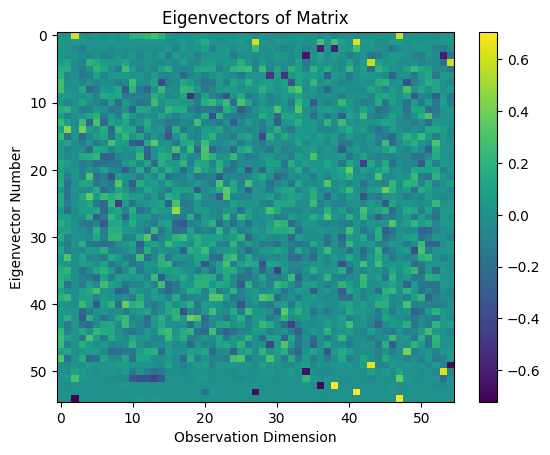

Eigenvectors of the STTC matrix

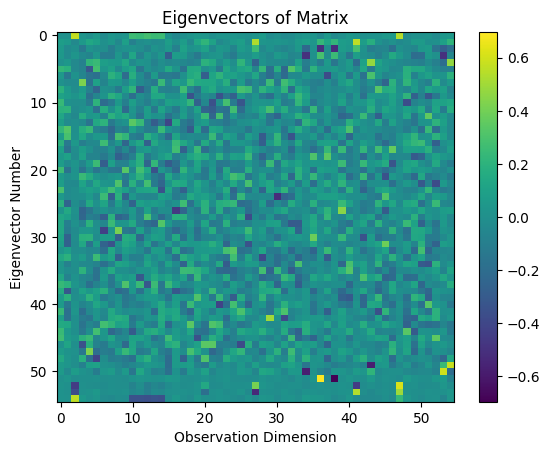

Eigenvectors of the toeplitz matrix

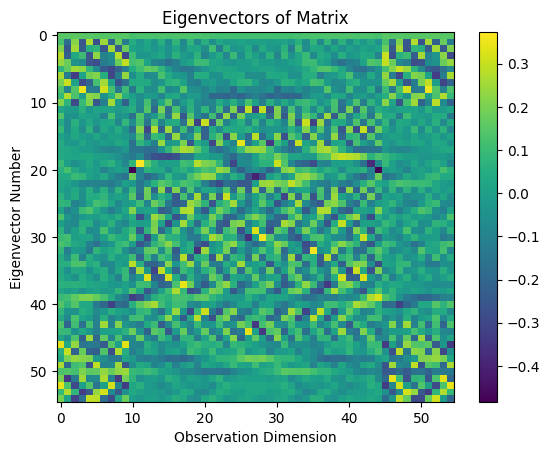

First four eigenvectors of the correlation matrix

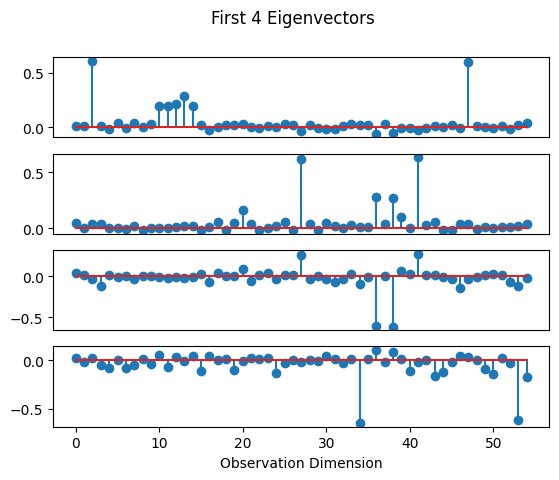

First four eigenvectors of the sttc matrix

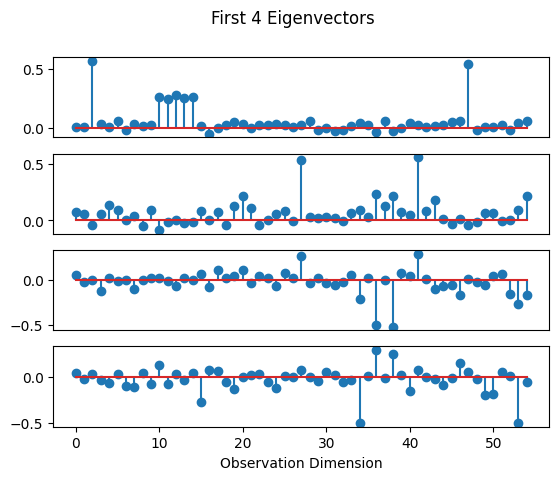

First four eigenvectors of the toeplitz matrix

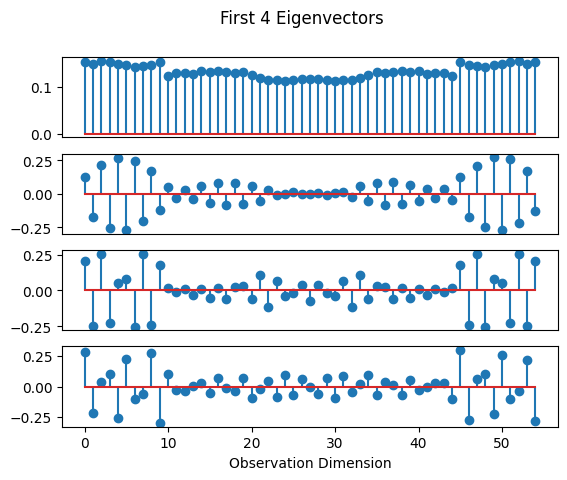

Eigenvalue spectrum

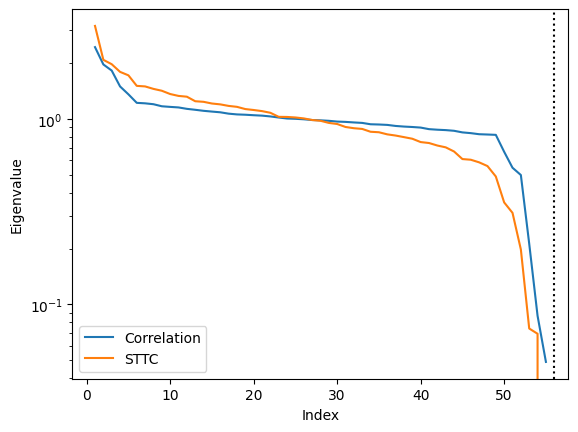

Reconstruction error

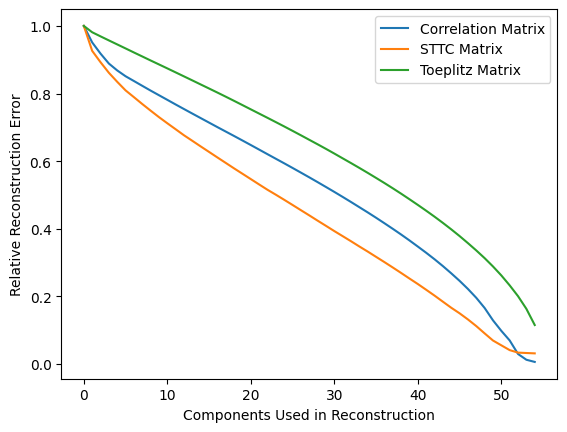

### Egeinvector Layout

Layout for correlation vectors

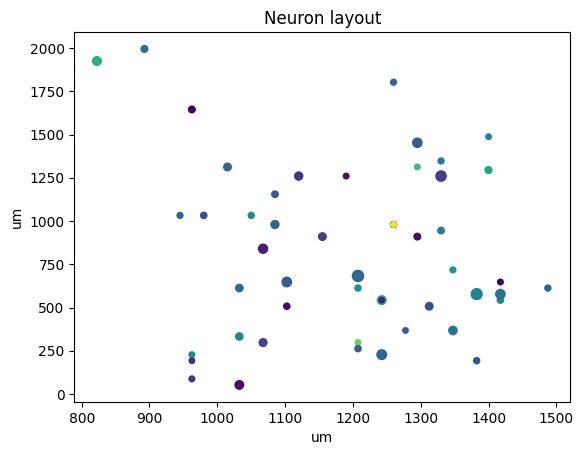 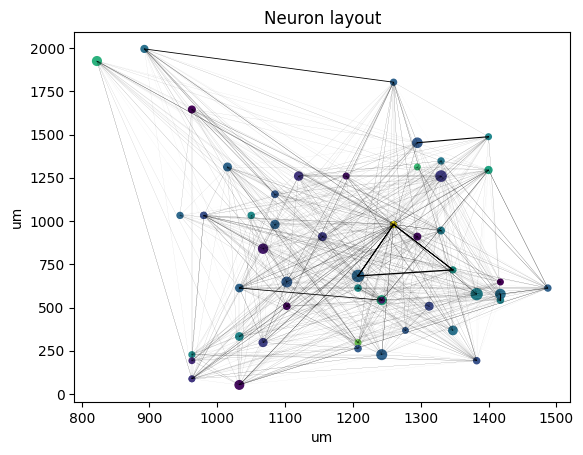

Layout for sttc vectors

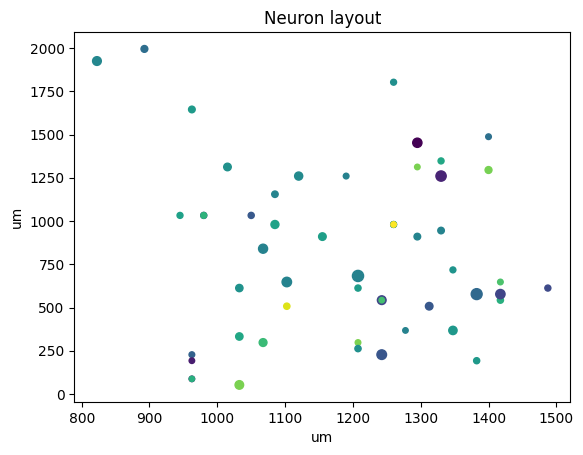 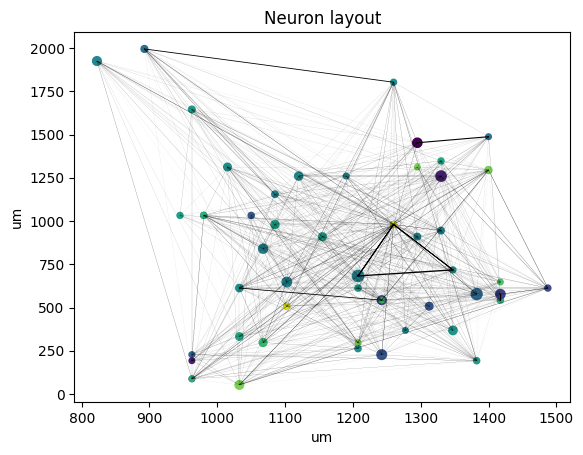

## Data Set 1:

Data set 1 has 64 neurons

The recording is approximately 40.0329 seconds long, with a total of 2415 spikes throughout.

The average firing rate for a neuron in the data set is 0.9425840995780971 with a cv of 0.7480127932773188. 

### Spike Rasters

we see two major haults in activity around 11 and 20 seconds

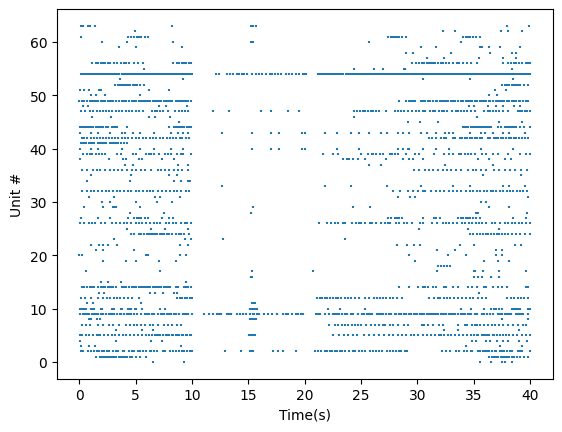
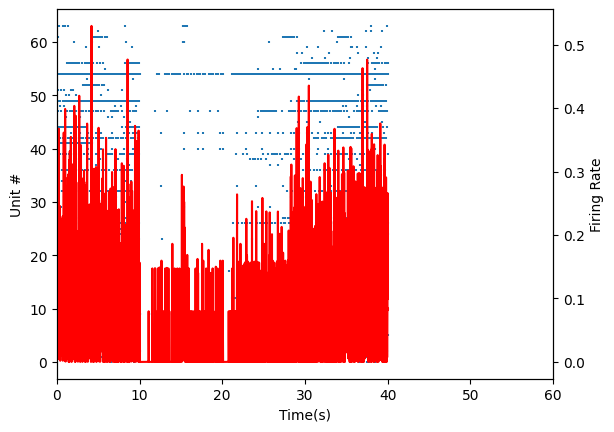
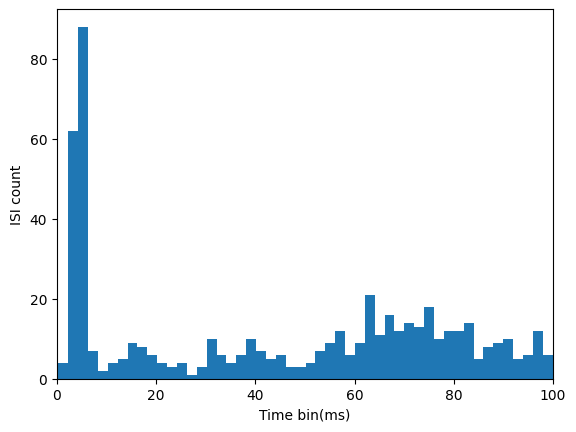

### Correlation and STTC matrices

Correlation Matrix

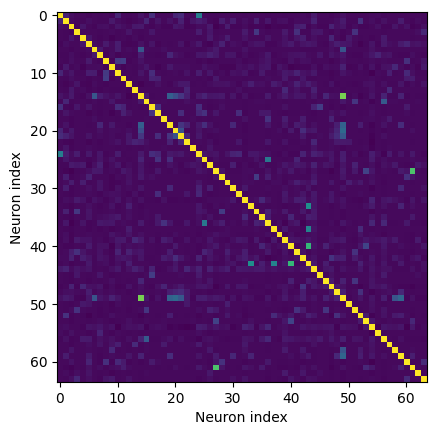

STTC matrix

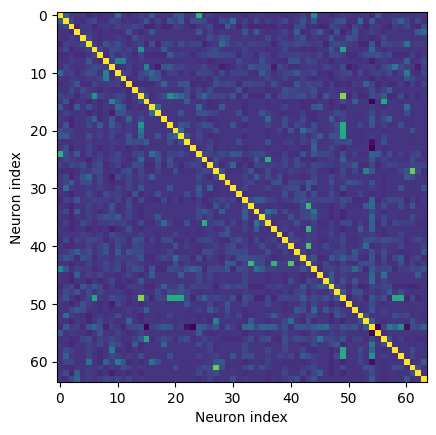

### Neuron Layout

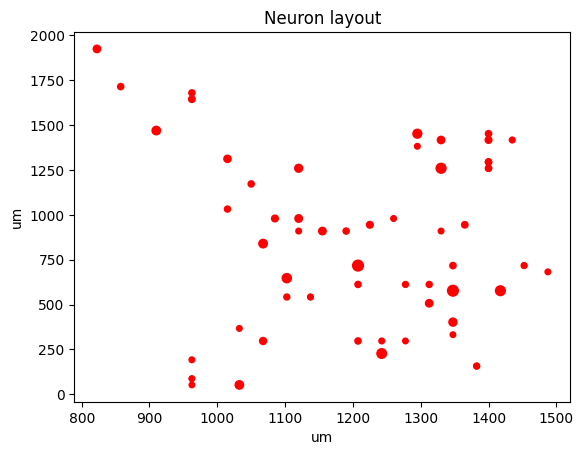

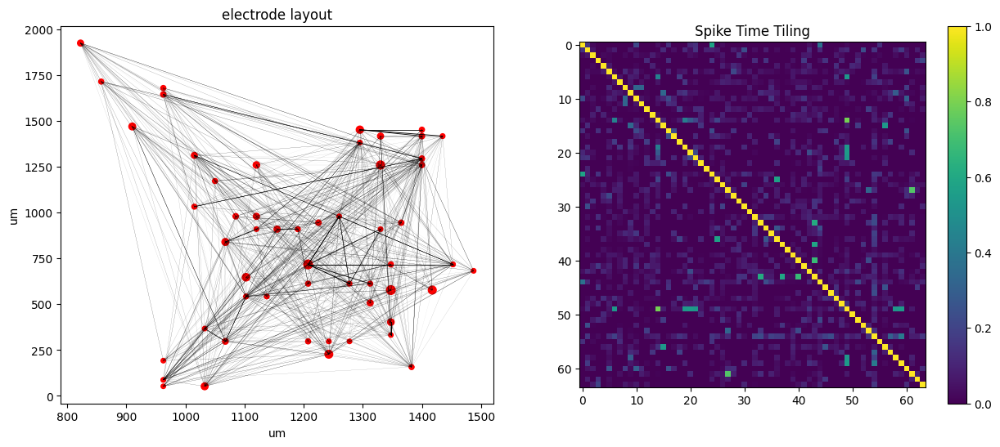

### Egeinvector Analysis

Eigenvectors of the correlation matrix

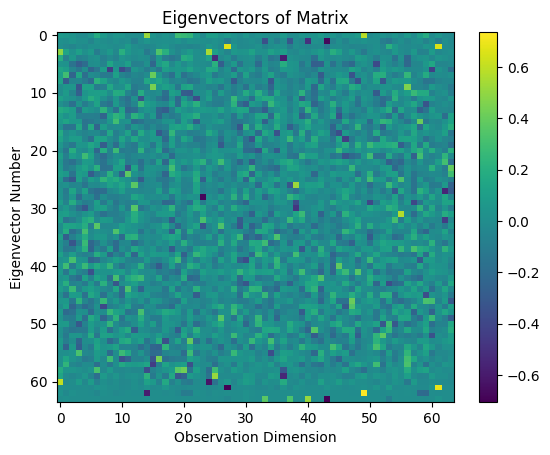

Eigenvectors of the STTC matrix

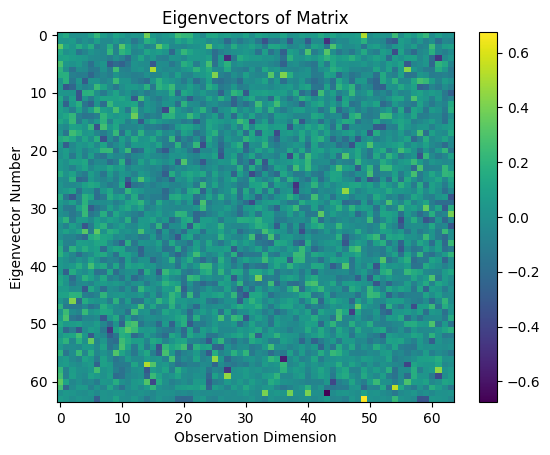

Eigenvectors of the toeplitz matrix

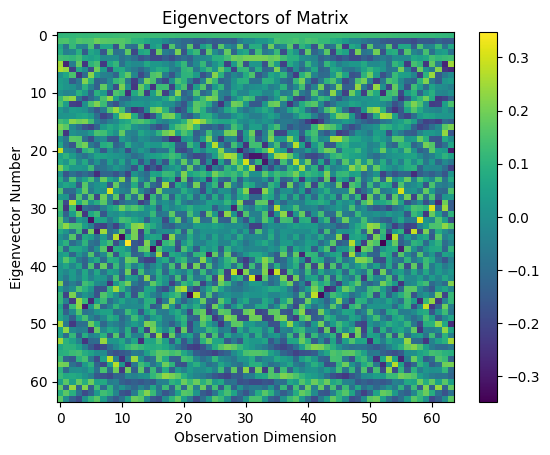

First four eigenvectors of the correlation matrix

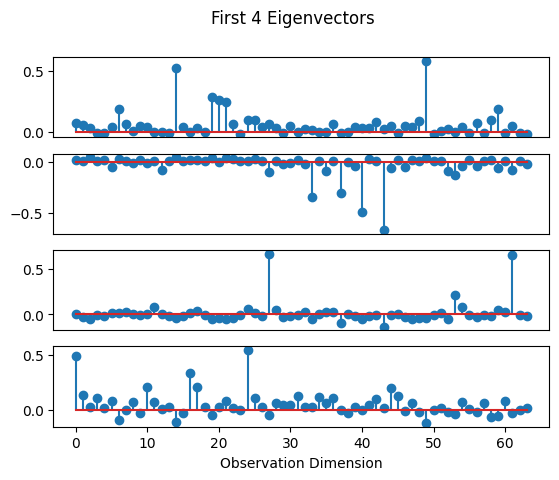

First four eigenvectors of the sttc matrix

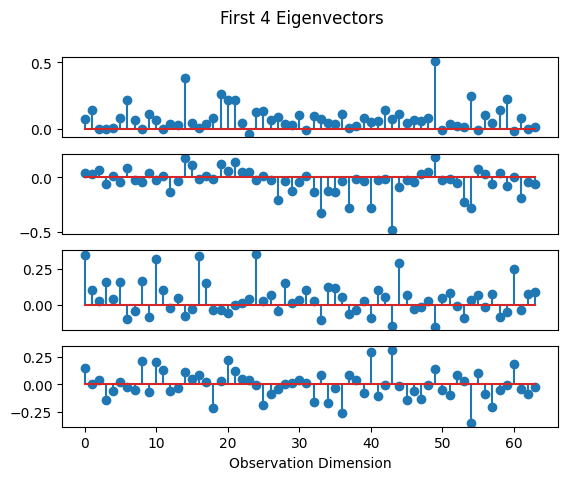

First four eigenvectors of the toeplitz matrix

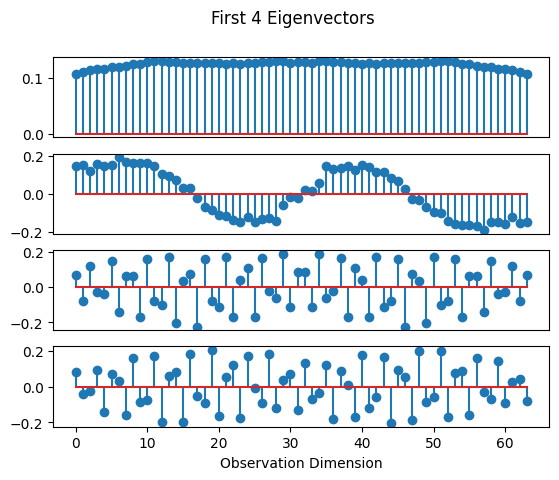

Eigenvalue spectrum

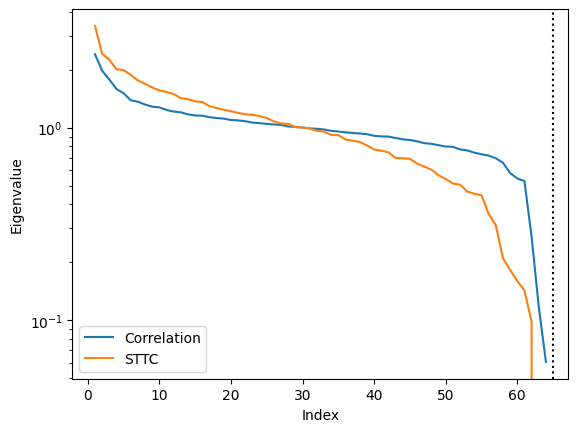

Reconstruction error

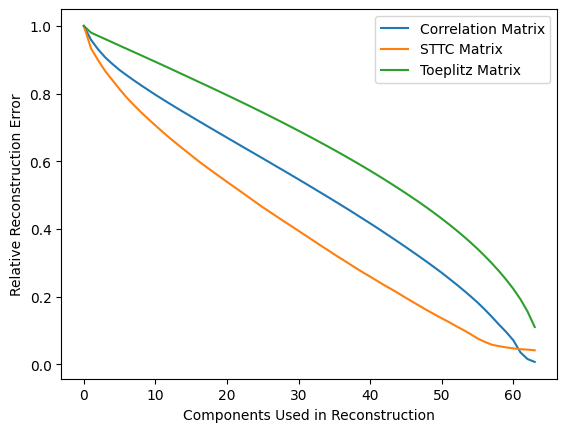

### Egeinvector Layout

Layout for correlation vectors

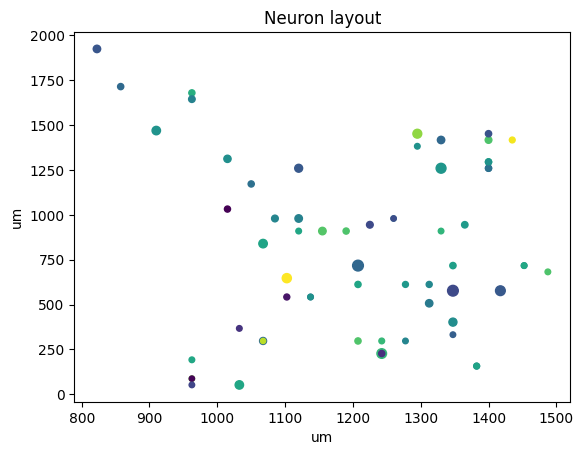 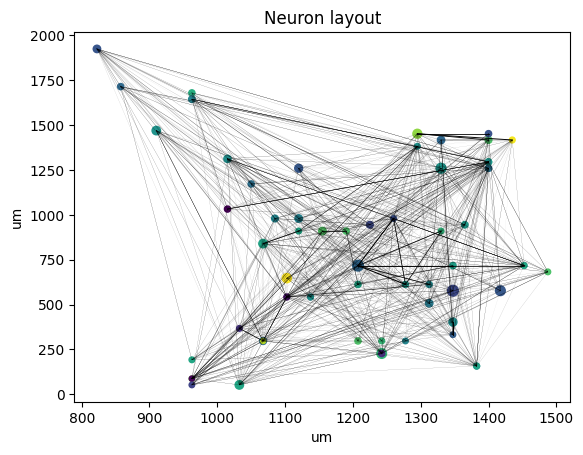

Layout for sttc vectors

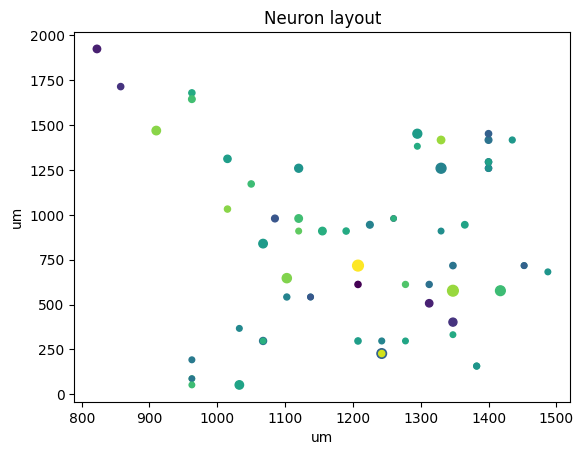 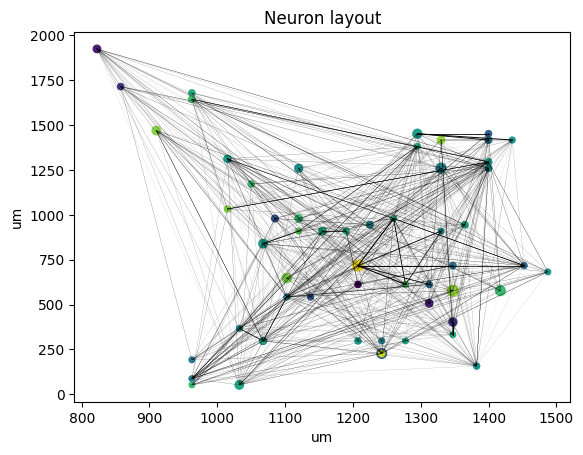

## Data Set 2:

we have 52 neurons in dataset 2

The recording is approximately 40.02555 seconds long, with a total of 2669 spikes throughout.

The average firing rate for a neuron in the data set is 1.2823539733226172 with a cv of 0.37651052239685134. 

### Spike Rasters

We see two haults in activity around 11 and 21 seconds

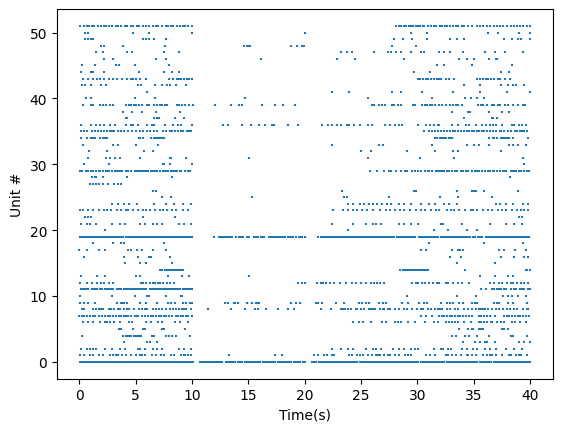
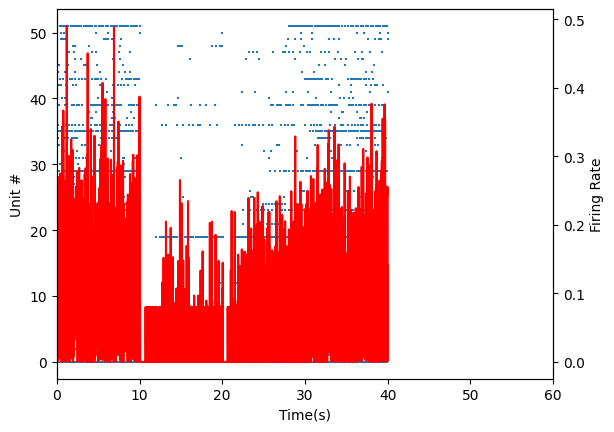
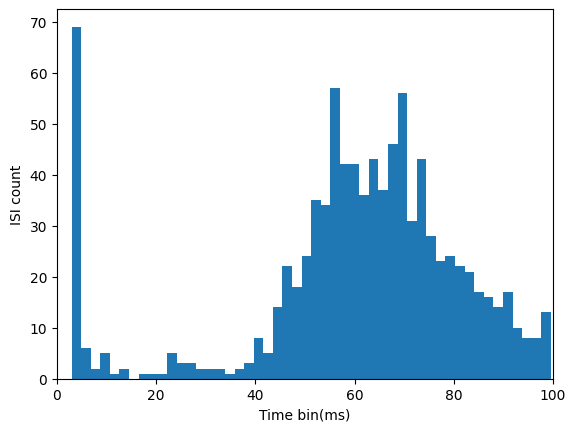

### Correlation and STTC matrices

Correlation matrix

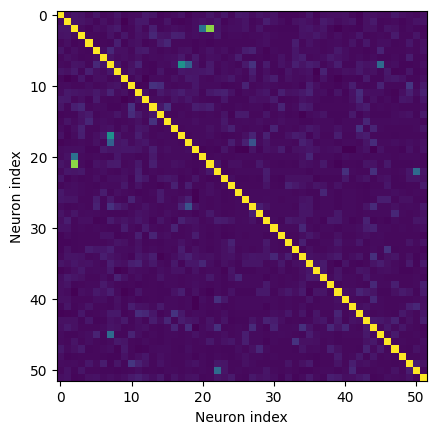

STTC matrix

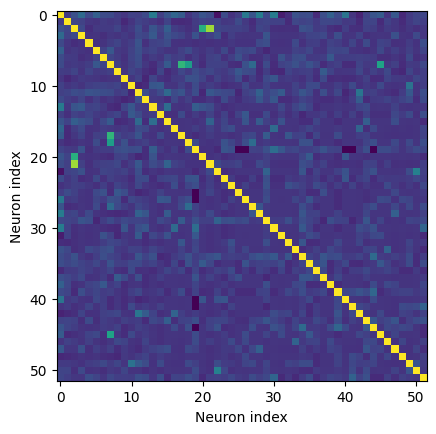

### Neuron Layout

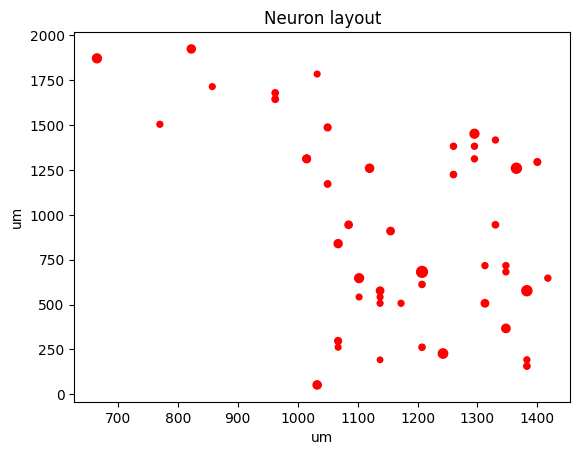

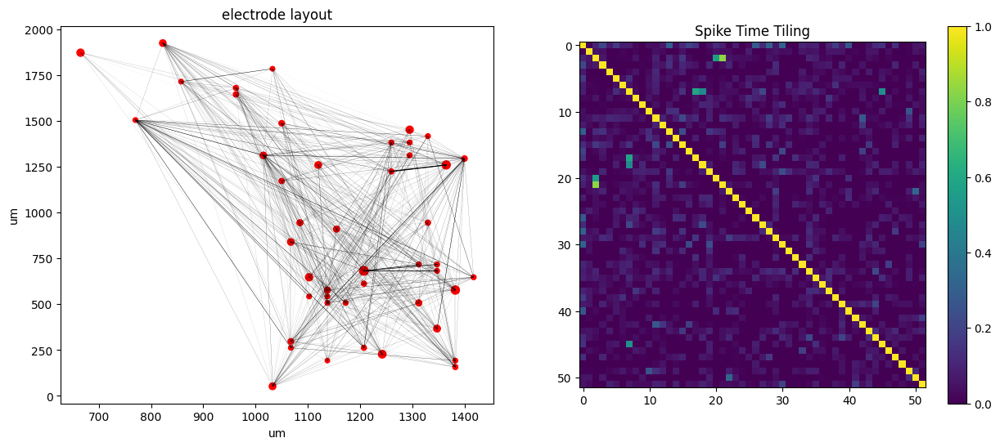

### Egeinvector Analysis

Eigenvectors of the correlation matrix

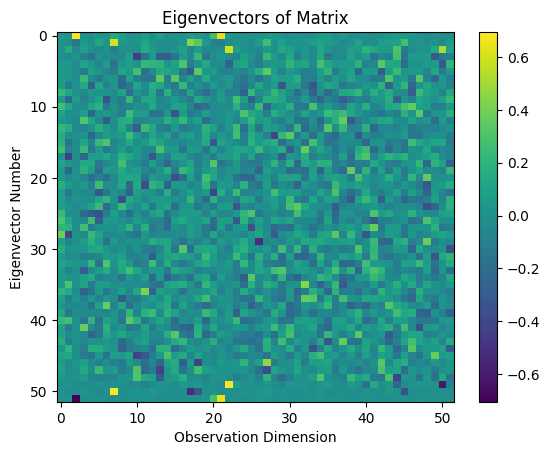

Eigenvectors of the STTC matrix

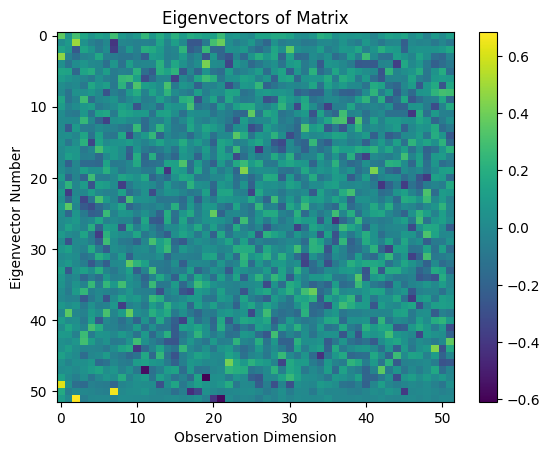

Eigenvectors of the toeplitz matrix

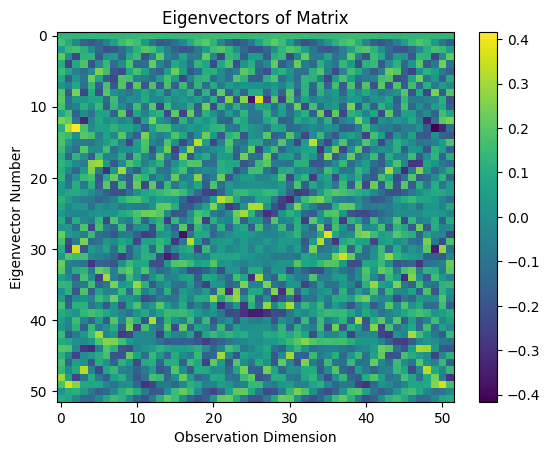

First four eigenvectors of the correlation matrix

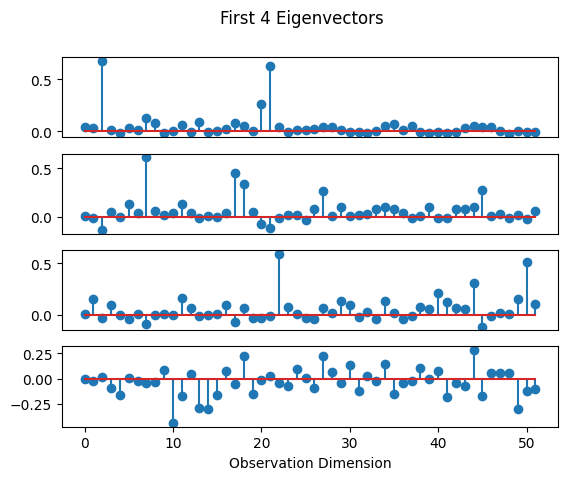

First four eigenvectors of the sttc matrix

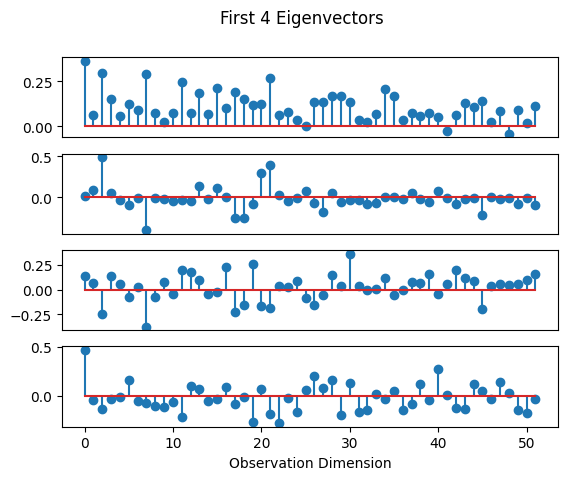

First four eigenvectors of the toeplitz matrix

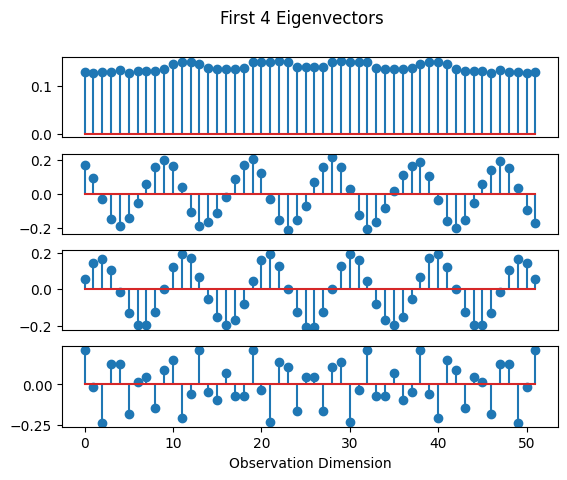

Eigenvalue spectrum

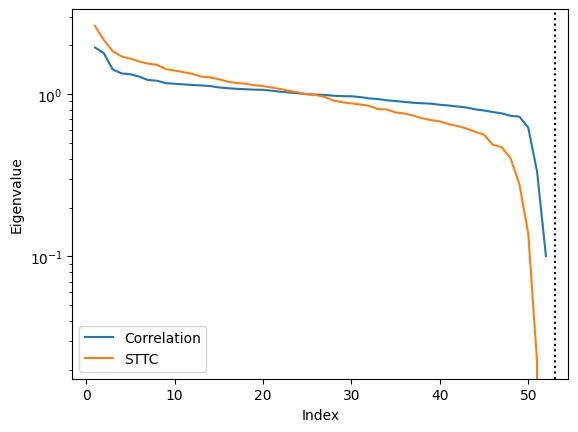

Reconstruction error

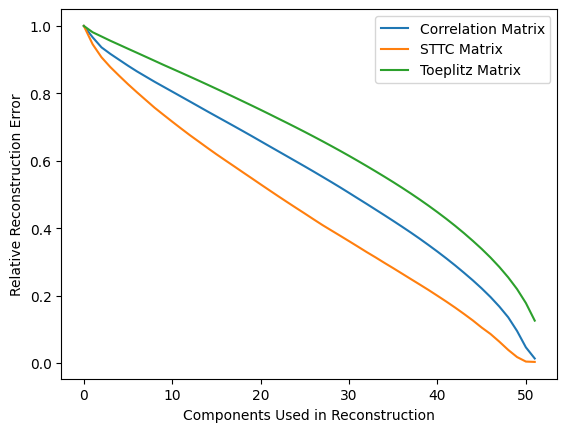

### Egeinvector Layout

Layout for correlation vectors

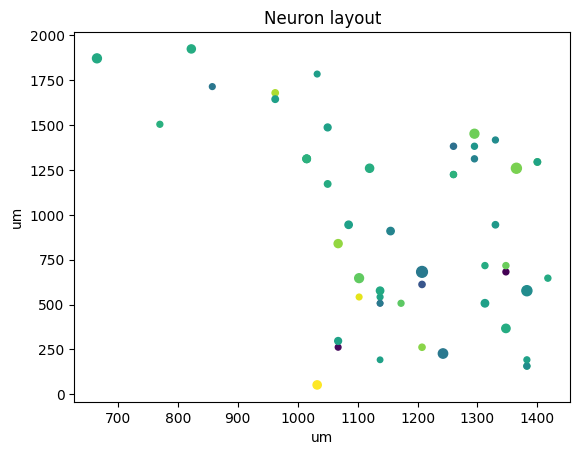 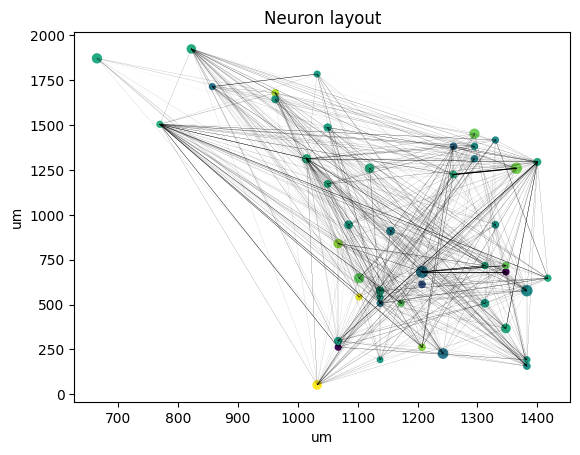

Layout for sttc vectors

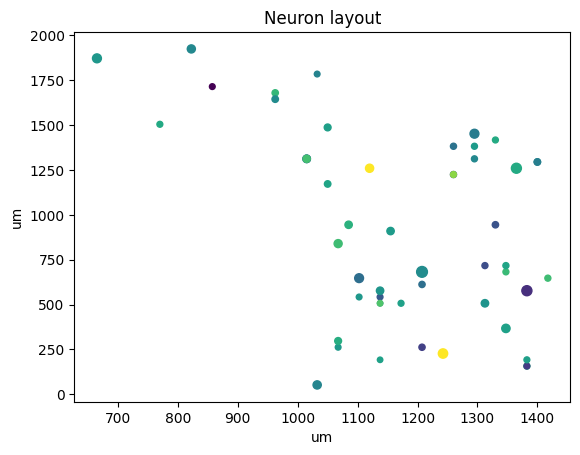 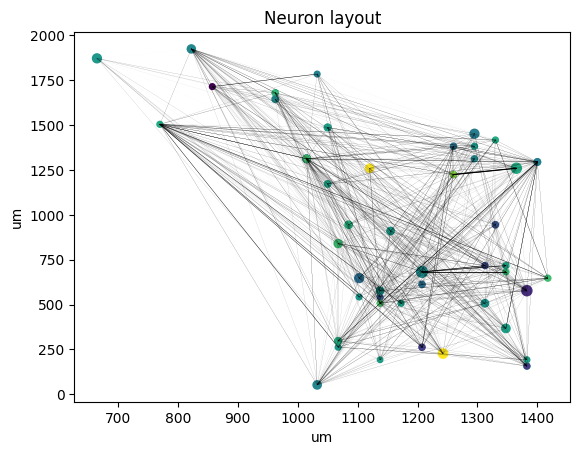

## Data Set 3:

There are 53 neurons in data set 3

The recording is approximately 40.031400000000005 seconds long, with a total of 2524 spikes throughout.

The average firing rate for a neuron in the data set is 1.1896321764773141 with a cv of 0.40952071715833777. 

### Spike Rasters

once again we see a hault in activity around 11 and 21 seconds

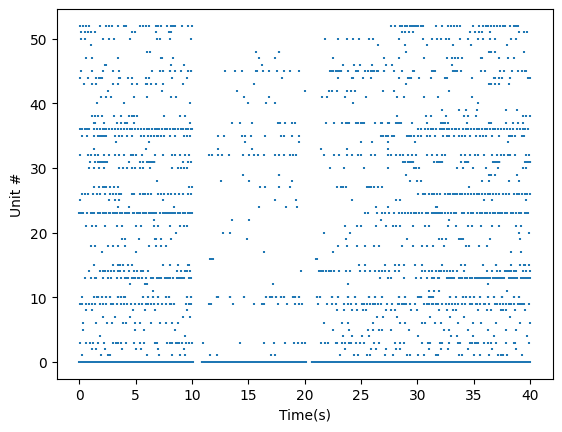
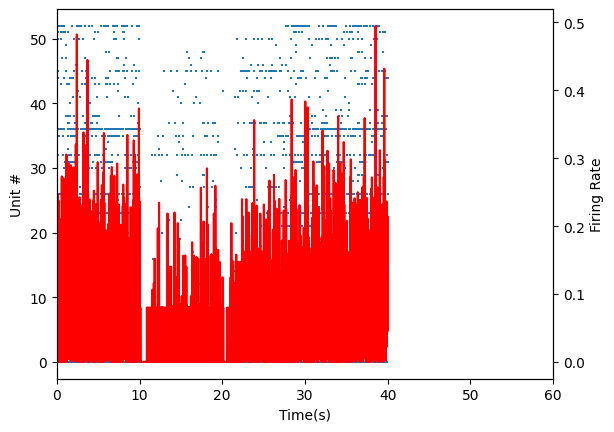
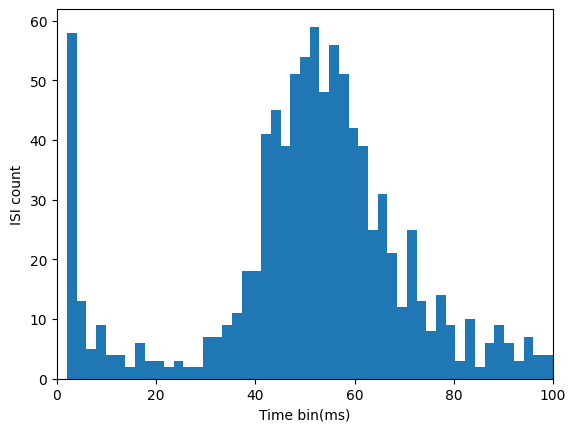

### Correlation and STTC matrices

Correlation matrix

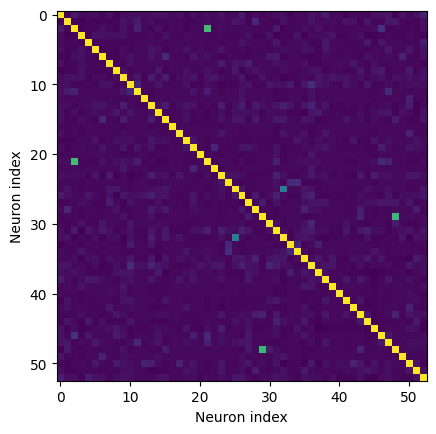

STTC matrix

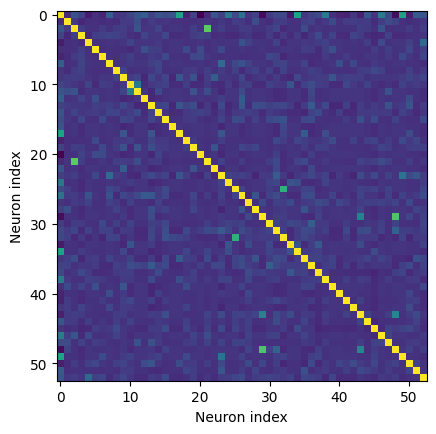

### Neuron Layout

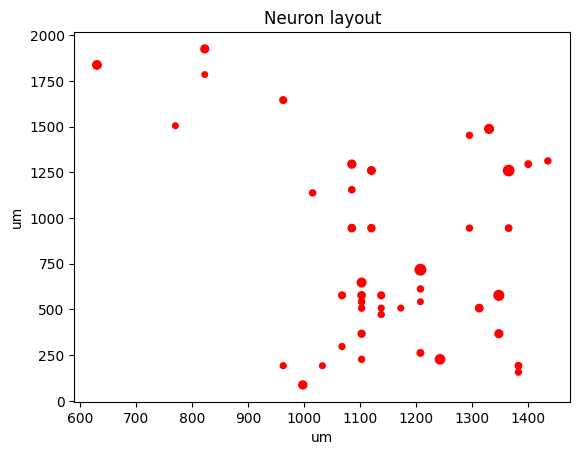

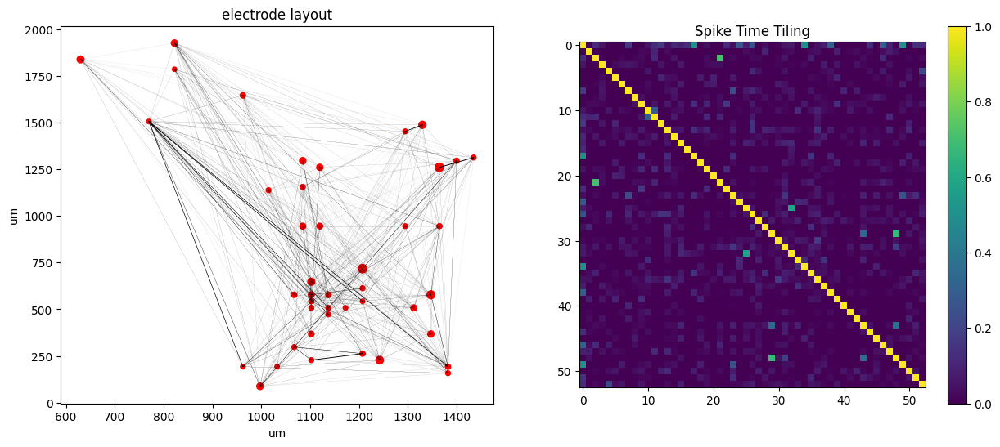

### Egeinvector Analysis

Eigenvectors of the correlation matrix

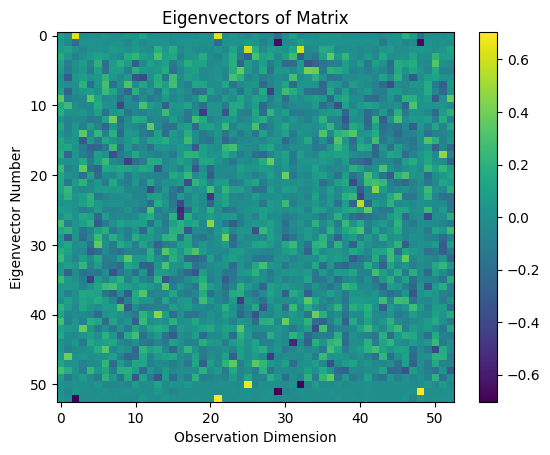

Eigenvectors of the STTC matrix

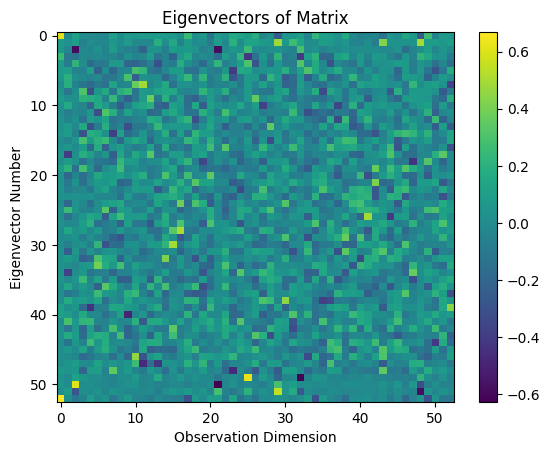

Eigenvectors of the toeplitz matrix

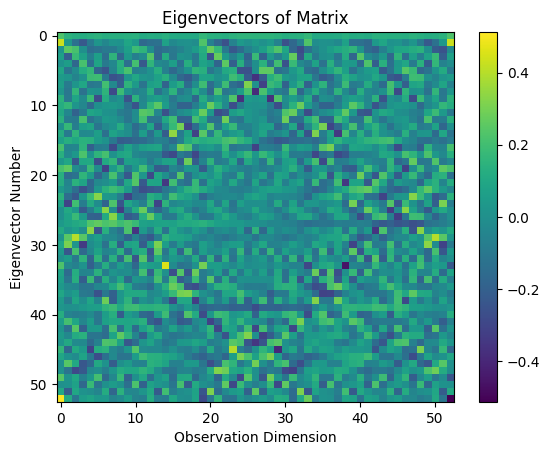

First four eigenvectors of the correlation matrix

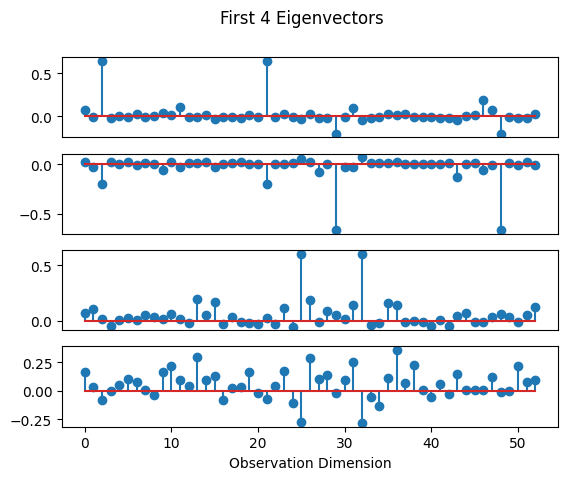

First four eigenvectors of the sttc matrix

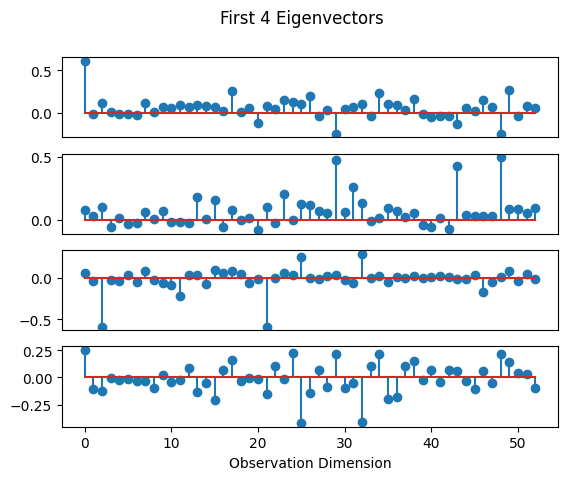

First four eigenvectors of the toeplitz matrix

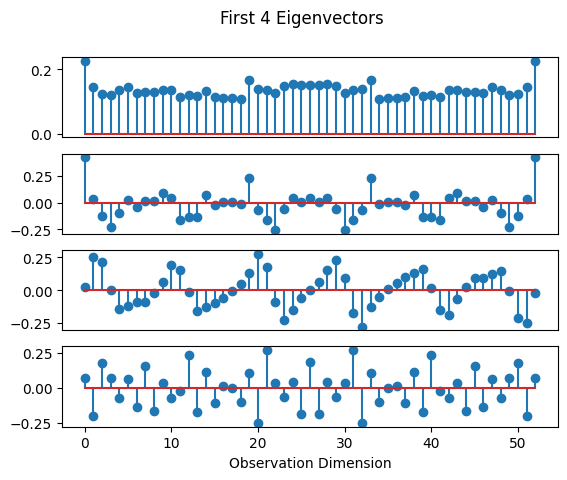

Eigenvalue spectrum

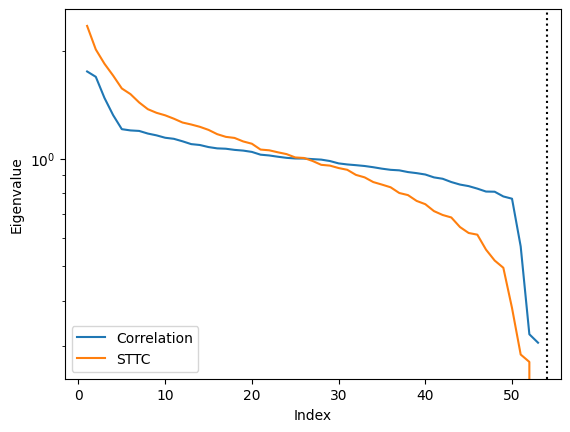

Reconstruction error

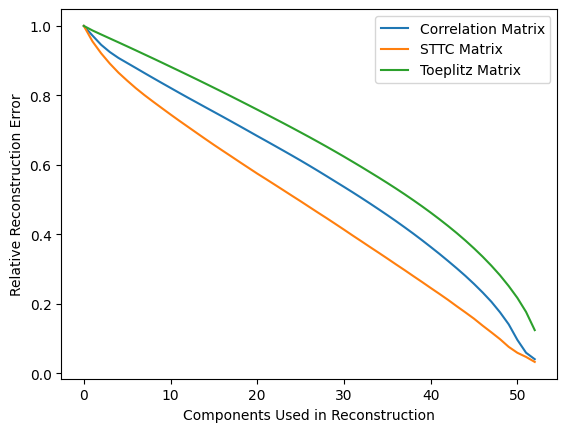

### Egeinvector Layout

Layout for correlation vectors

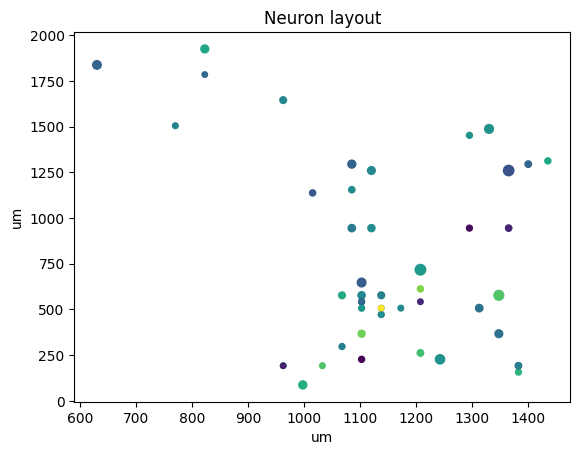 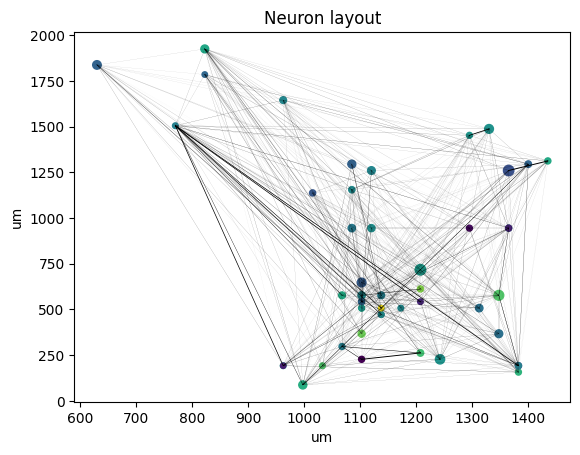

Layout for sttc vectors

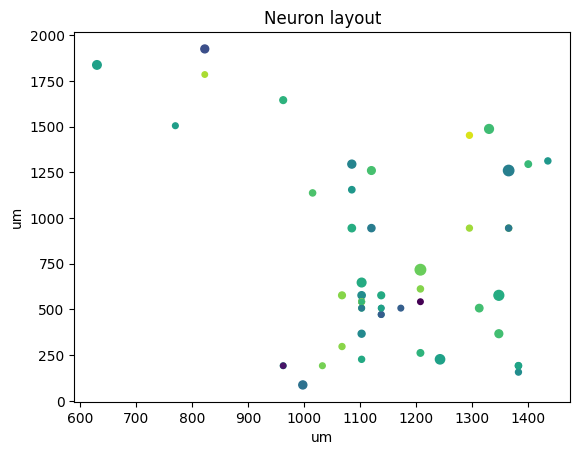 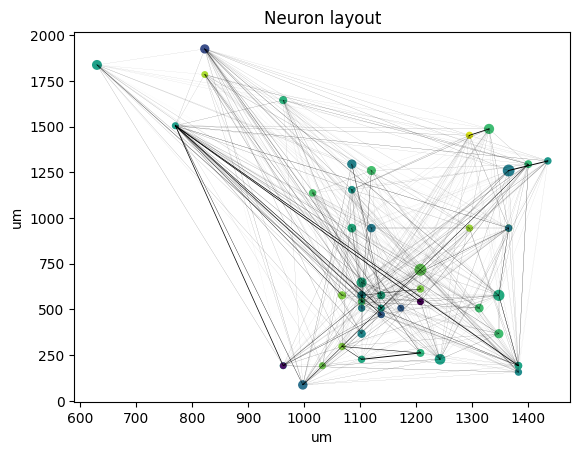

## Data Set 4:

There are 72 neurons in data set 4

The recording is approximately 40.0456 seconds long, with a total of 2850 spikes throughout.

The average firing rate for a neuron in the data set is 0.9884564929313916 with a cv of 0.5587538519498668. 

### Spike Rasters

We're seeing a consistent result of low activity at 11 and 21 seconds

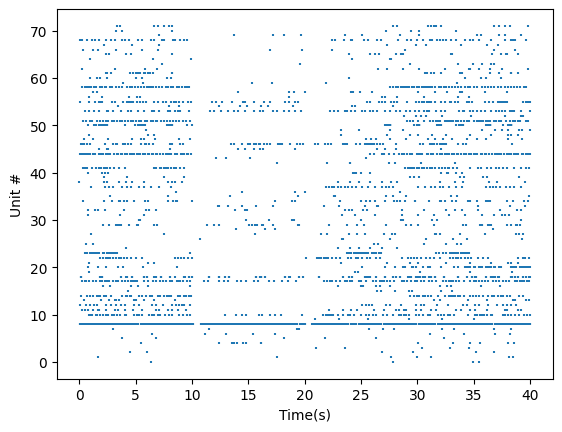
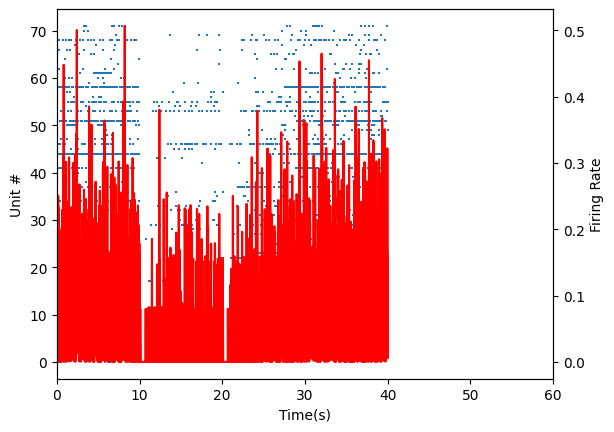
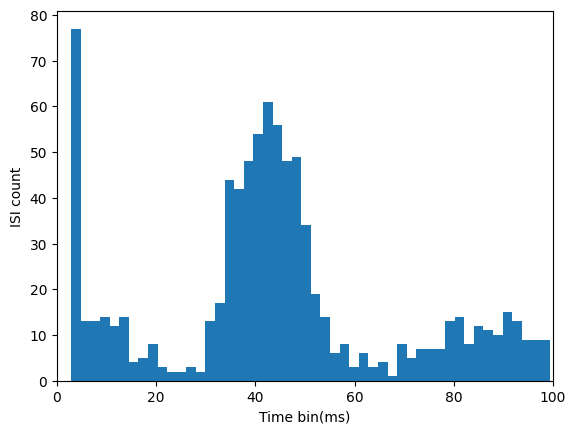

### Correlation and STTC matrices

Correlation matrix

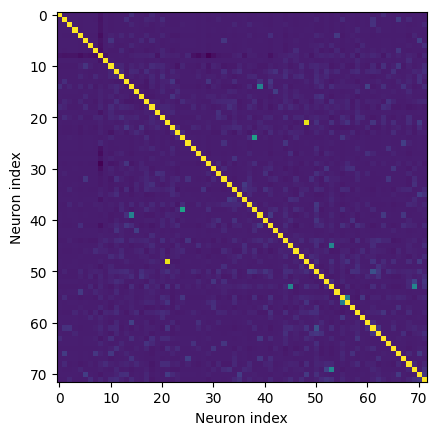

STTC matrix

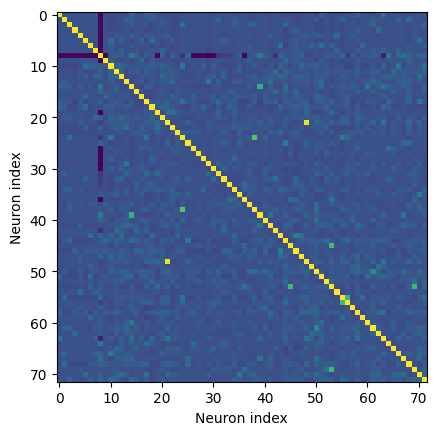

### Neuron Layout

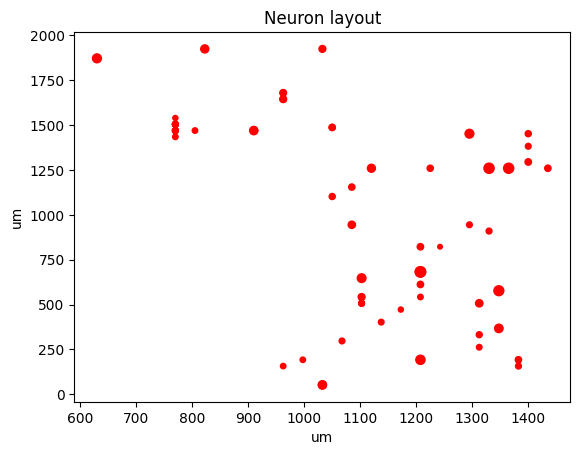

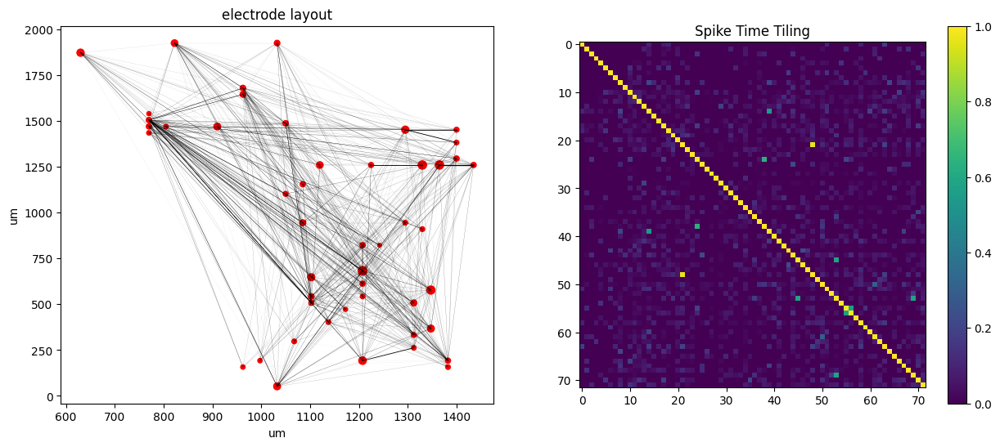

### Egeinvector Analysis

Eigenvectors of the correlation matrix

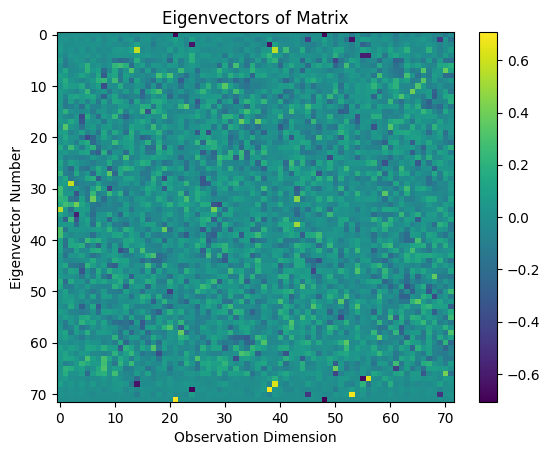

Eigenvectors of the STTC matrix

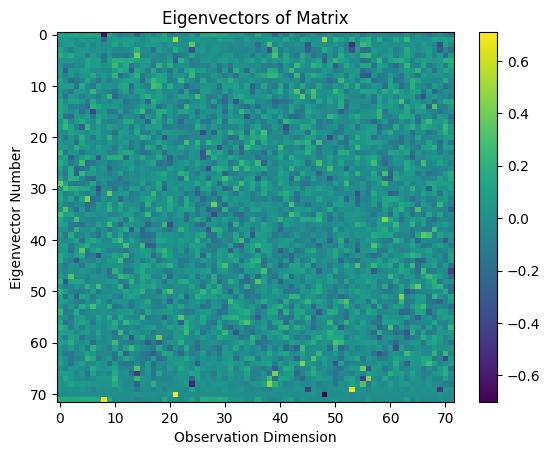

Eigenvectors of the toeplitz matrix

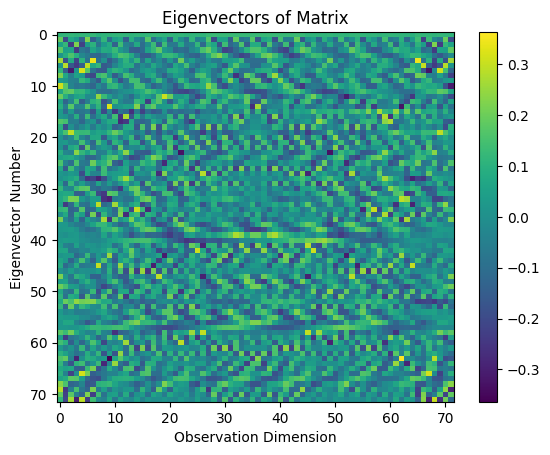

First four eigenvectors of the correlation matrix

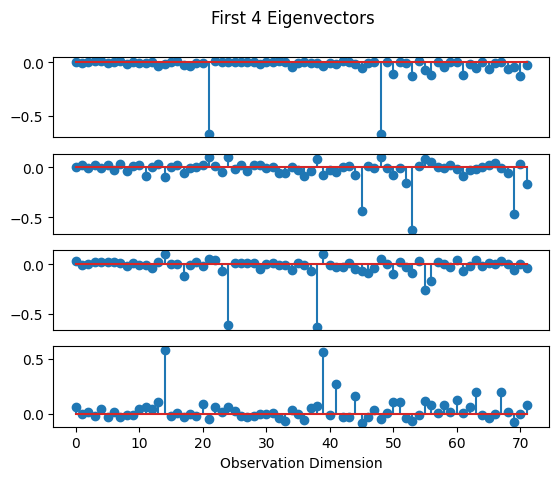

First four eigenvectors of the sttc matrix

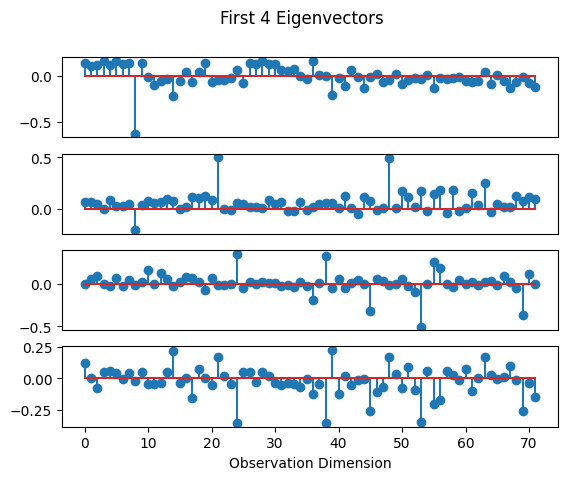

First four eigenvectors of the toeplitz matrix

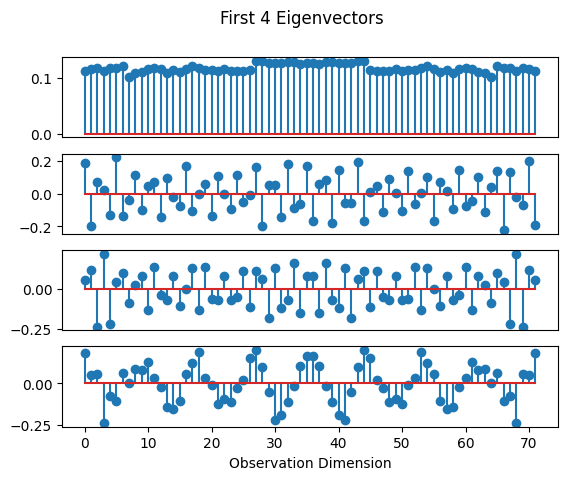

Eigenvalue spectrum

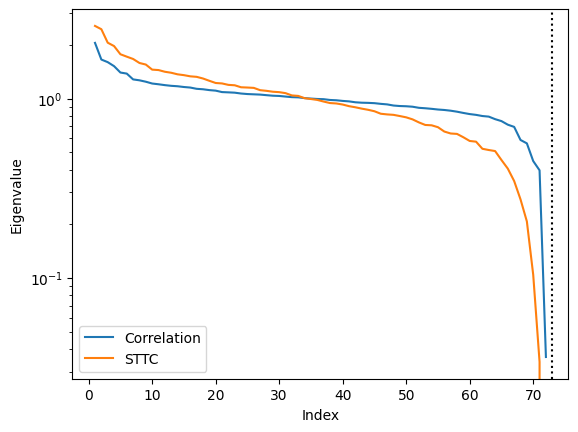

Reconstruction error

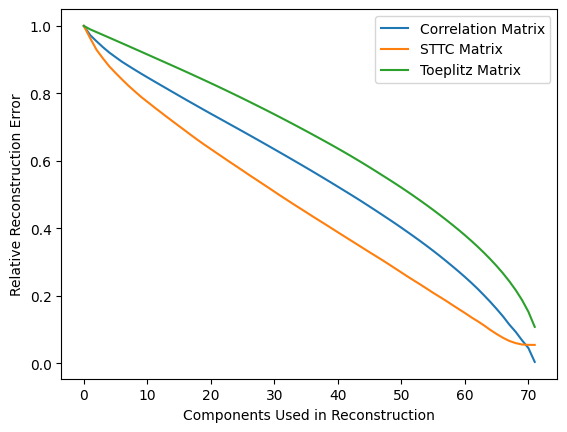

### Egeinvector Layout

Layout for correlation vectors

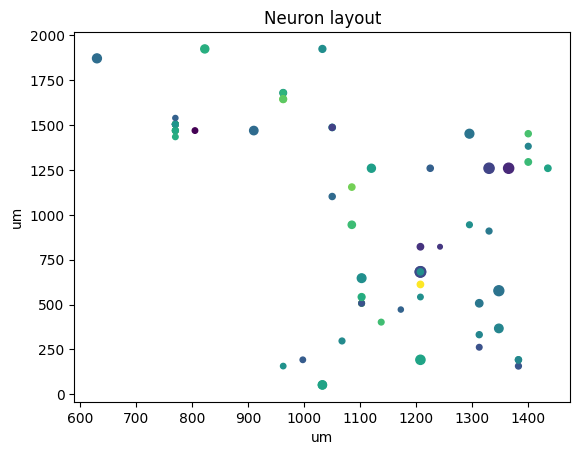 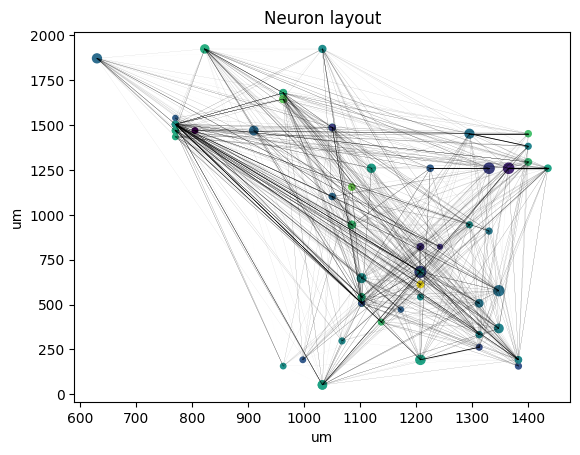

Layout for sttc vectors

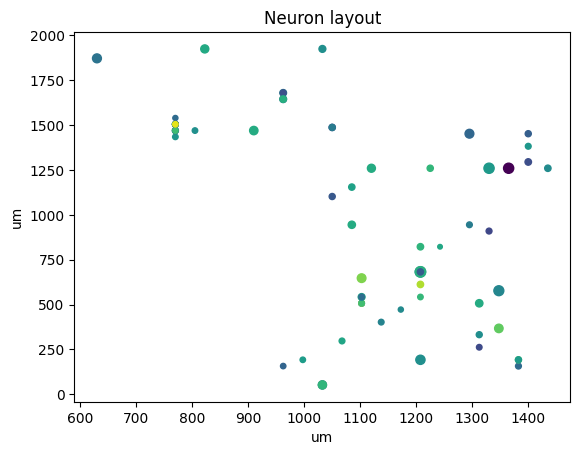 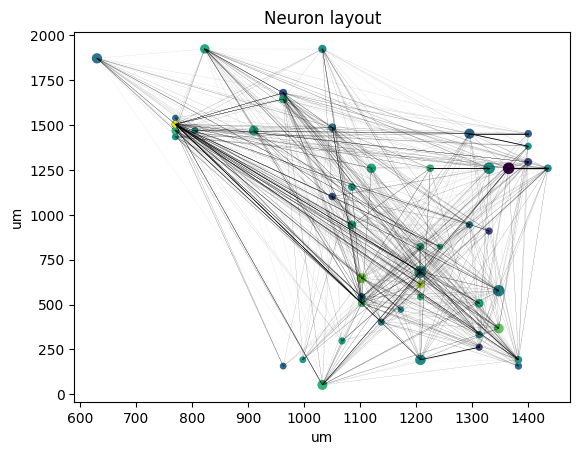

## Data Set 5:

There are 72 neurons in data set 5

The recording is approximately 70.0784 seconds long, with a total of 9215 spikes throughout.

The average firing rate for a neuron in the data set is 1.8263275290404906 with a cv of 0.4833534207744331. 

### Spike Rasters

This test was ran a long time, we once again see a hault in activity at 11 and 21 seconds

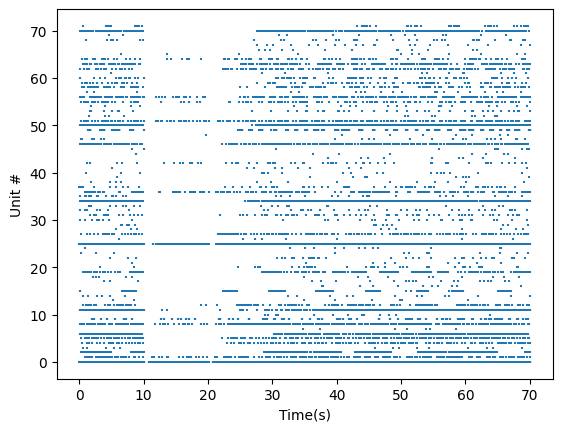
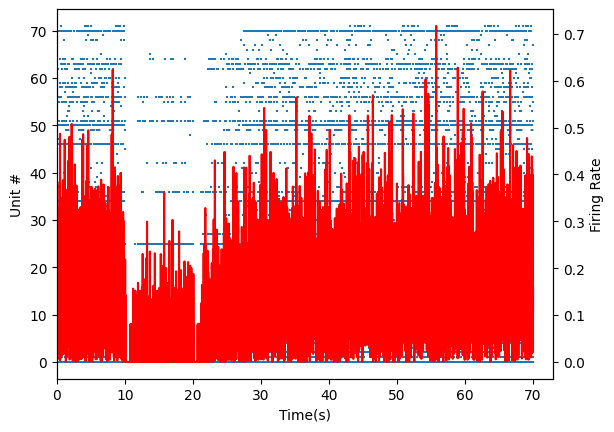
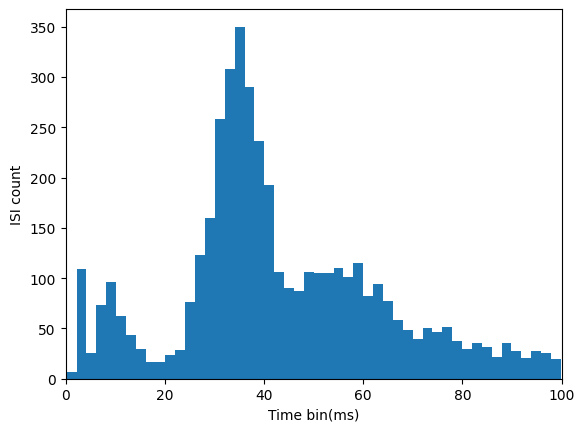

### Correlation and STTC matrices

Correlation matrix

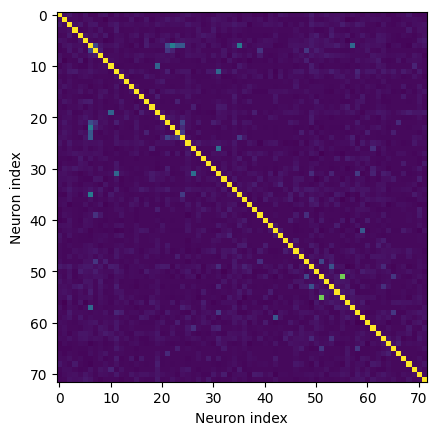

STTC matrix

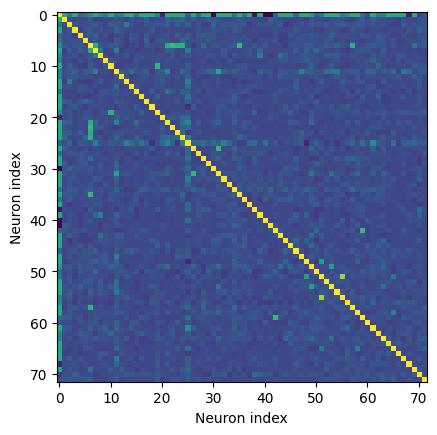

weirdly enough, in the sttc we see some correlation with all the neurons and neuron 0

### Neuron Layout

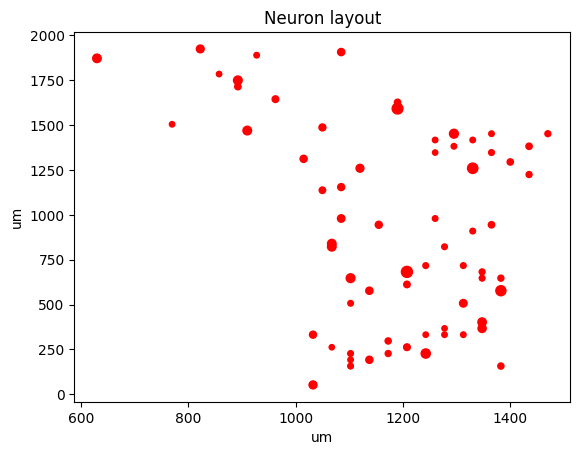

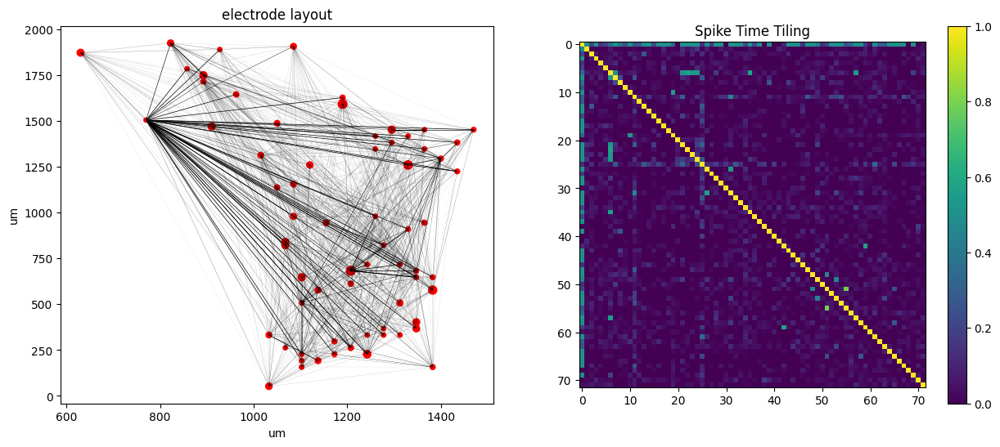

### Egeinvector Analysis

Eigenvectors of the correlation matrix

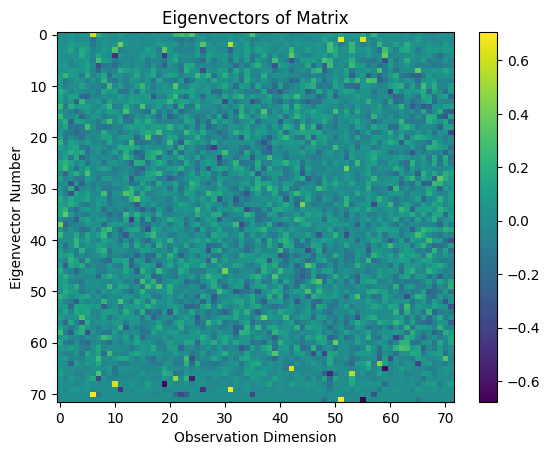

Eigenvectors of the STTC matrix

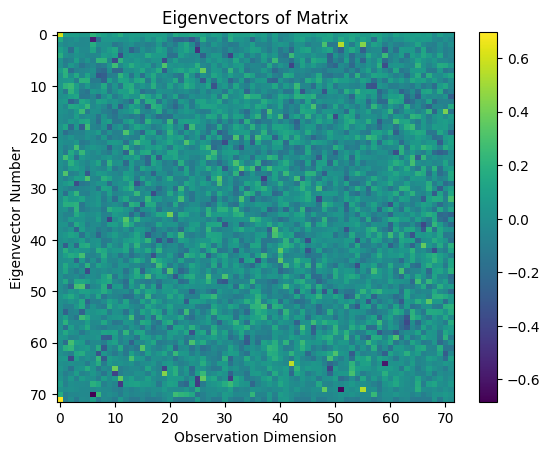

Eigenvectors of the toeplitz matrix

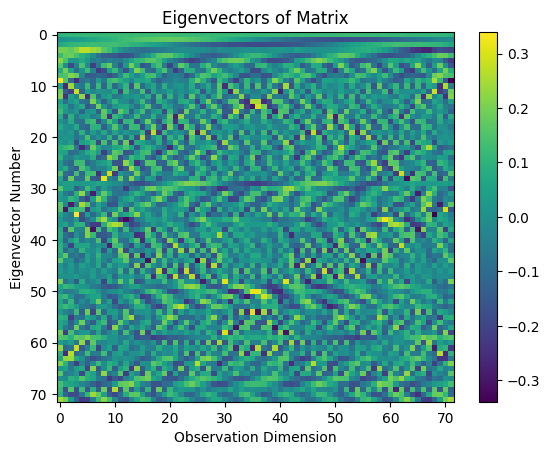

First four eigenvectors of the correlation matrix

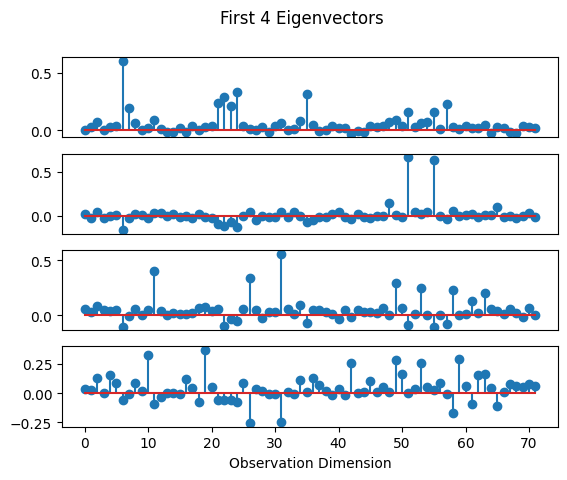

First four eigenvectors of the sttc matrix

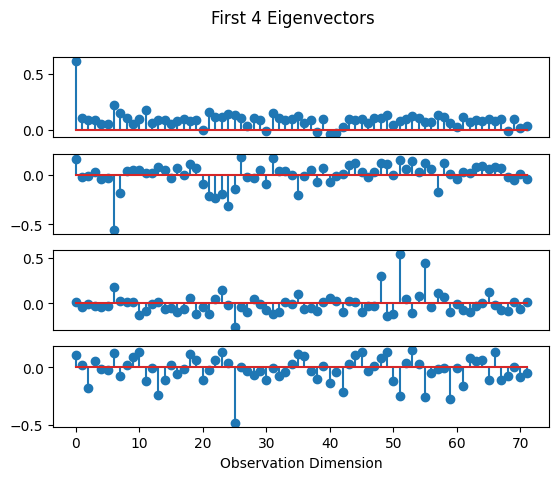

First four eigenvectors of the toeplitz matrix

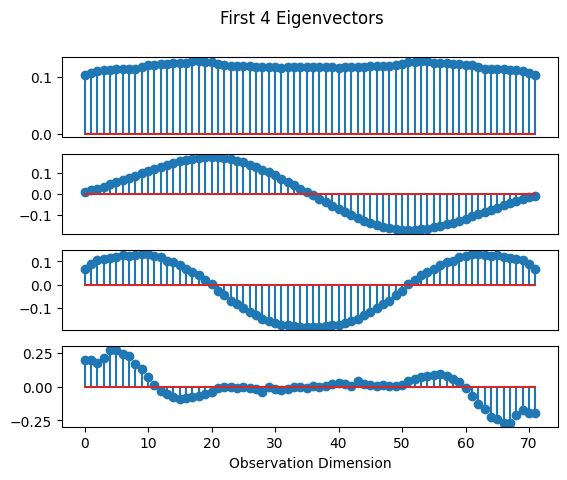

Eigenvalue spectrum

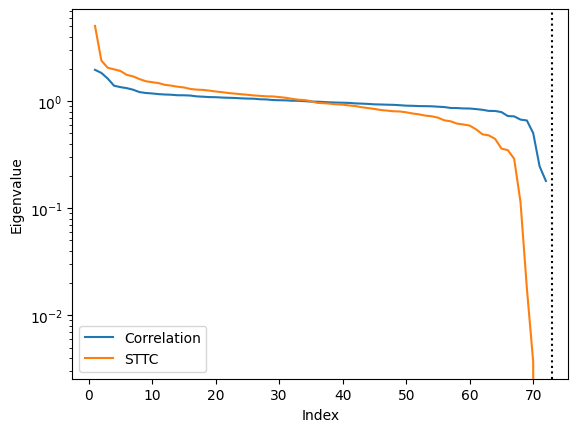

Reconstruction error

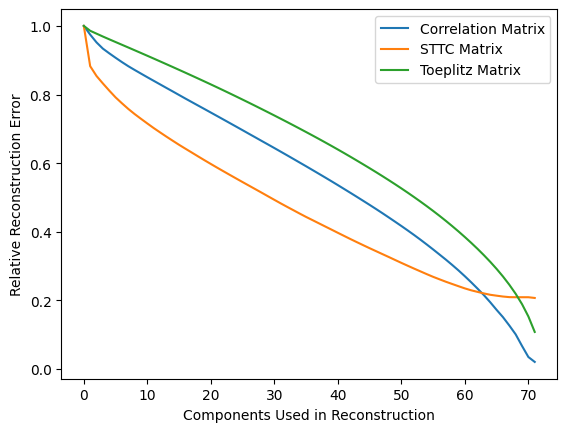

### Egeinvector Layout

Layout for correlation vectors

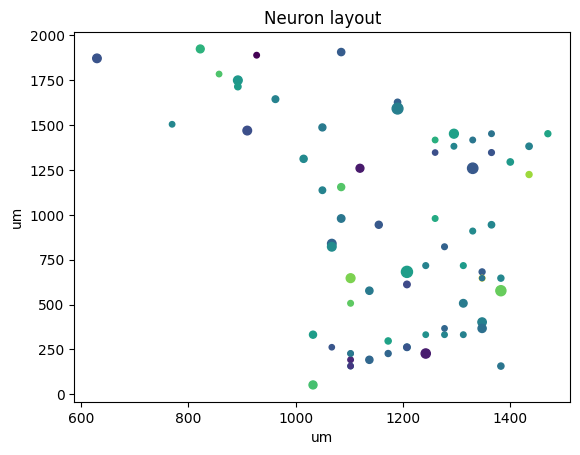 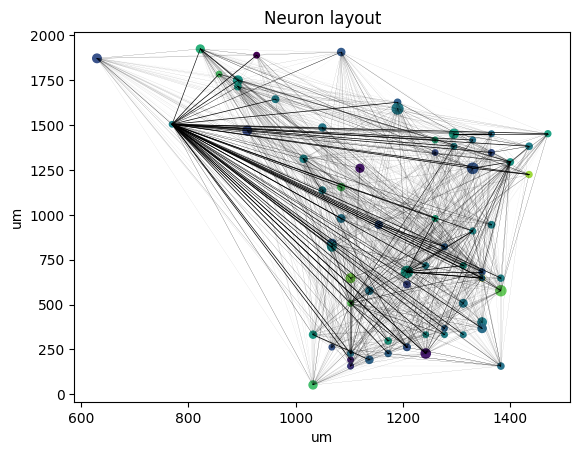

Layout for sttc vectors

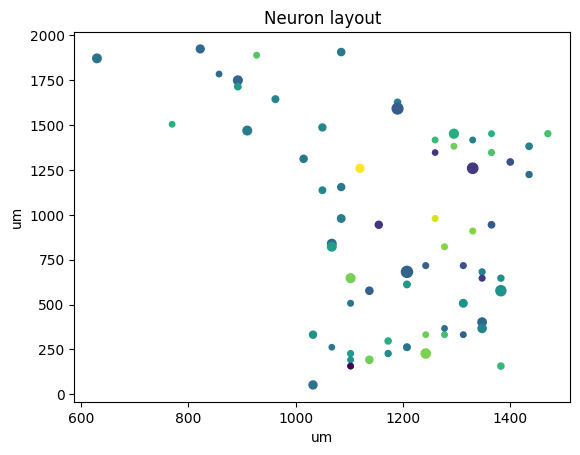 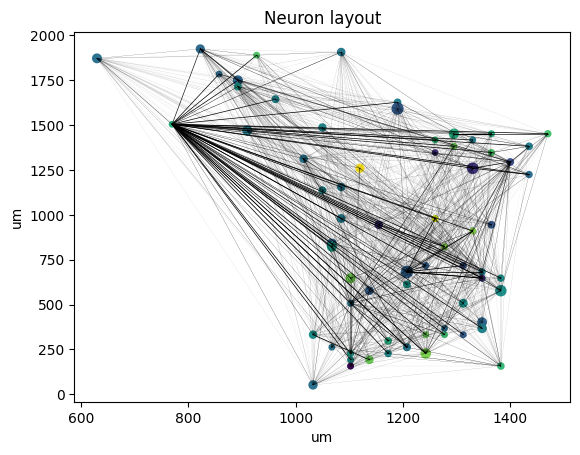

## Data Set 6:

There are 59 neurons in data set 6 

The recording is approximately 120.0091 seconds long, with a total of 26625 spikes throughout.

The average firing rate for a neuron in the data set is 3.760308063644157 with a cv of 1.0110869937831166. 

### Spike Rasters

We see a lot more haults in activity, and these haults seem to happen periodically, starting at 1 and then happening again at 19, from there these haults happen every 20 seconds, I provided a zoomed in plot to better show this, the ISI plot also shows a slightly more poisson-like distribution than in other data sets

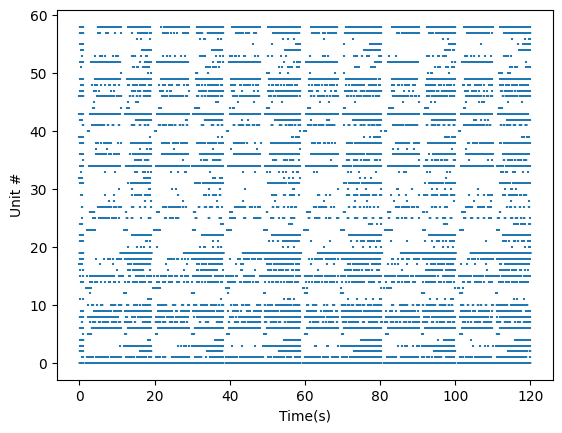
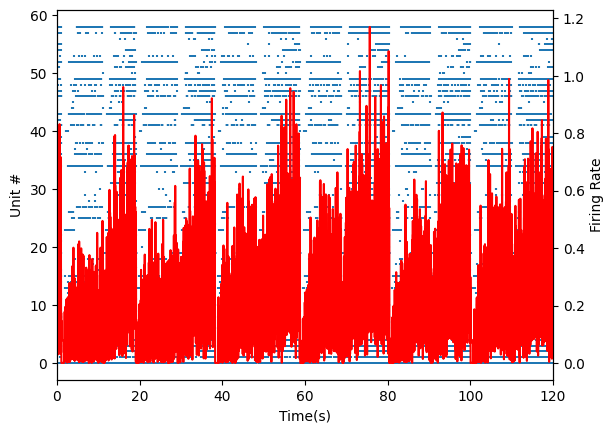
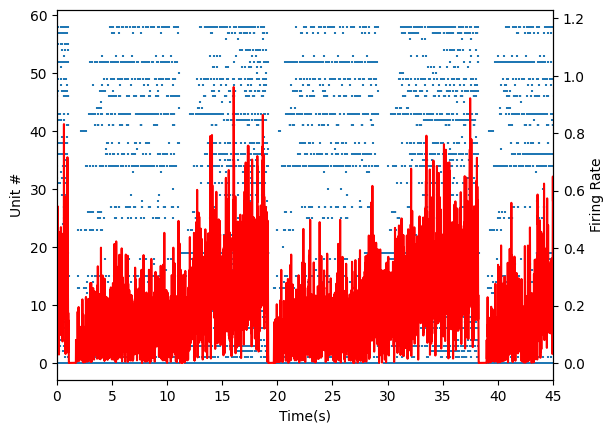
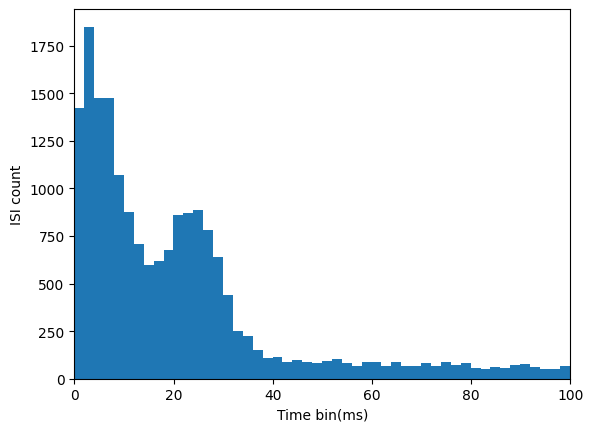

### Correlation and STTC matrices

Correlation matrix

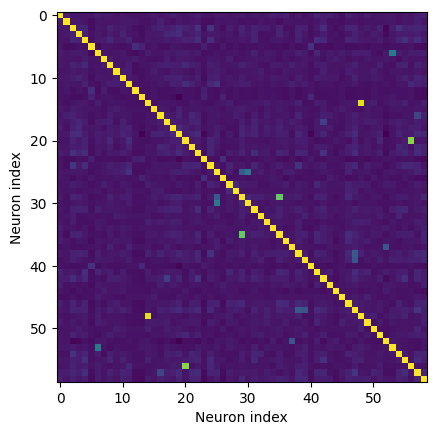

STTC matrix

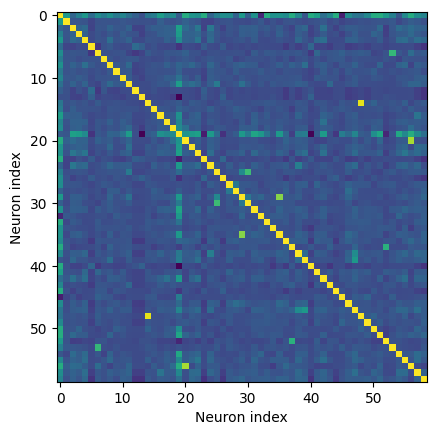

Like with data set 5, the STTC matrix shows a few neurons which positively correlate with most other neurons in the slice, here these are neurons 0 and 19. 

### Neuron Layout

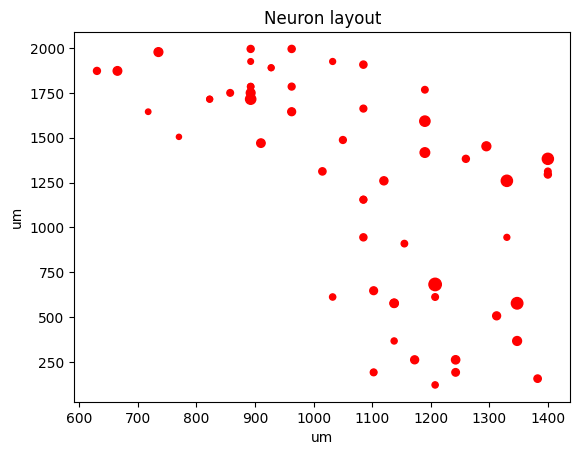

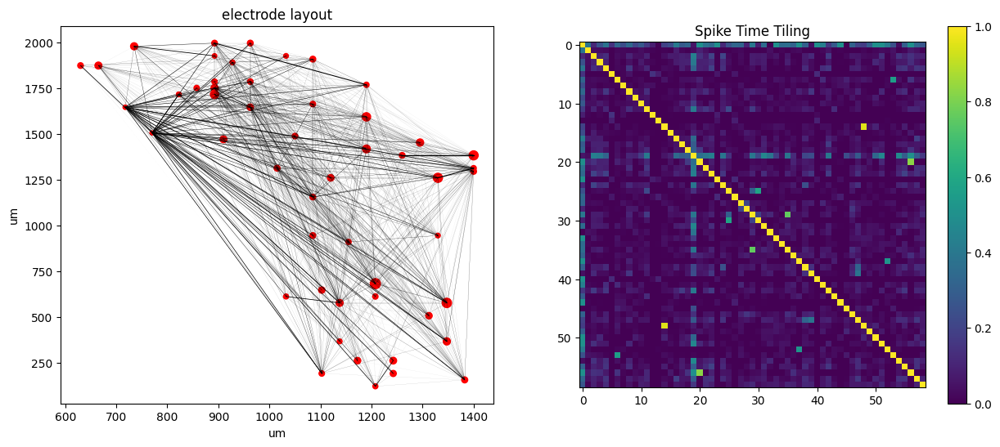

### Egeinvector Analysis

Eigenvectors of the correlation matrix

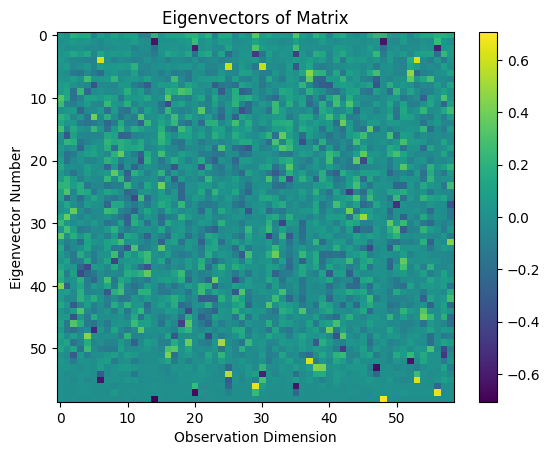

Eigenvectors of the STTC matrix

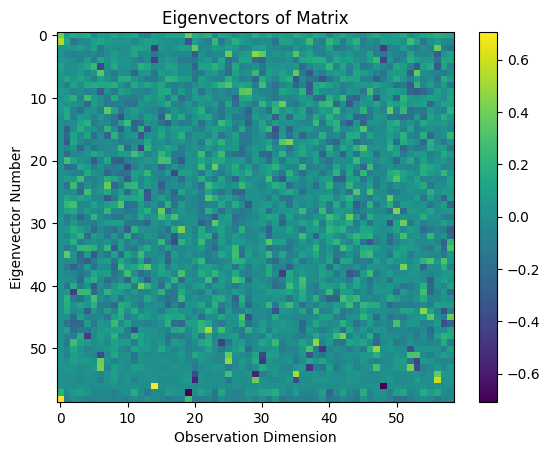

Eigenvectors of the toeplitz matrix

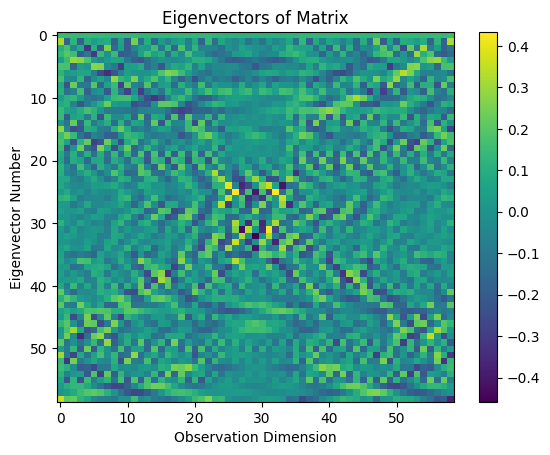

First four eigenvectors of the correlation matrix

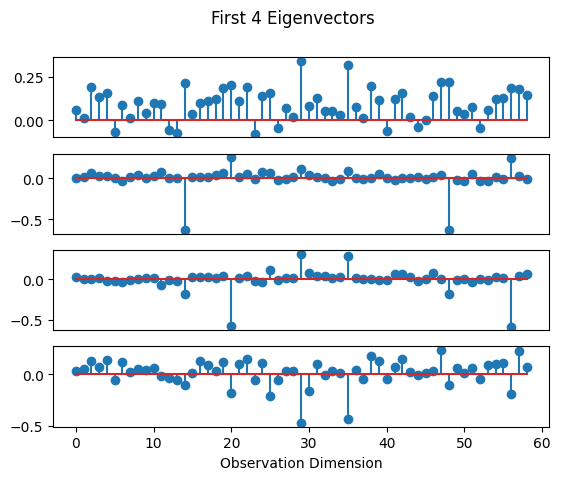

First four eigenvectors of the sttc matrix

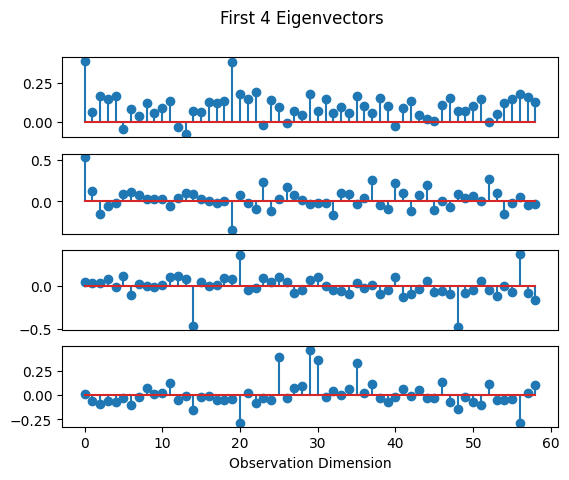

First four eigenvectors of the toeplitz matrix

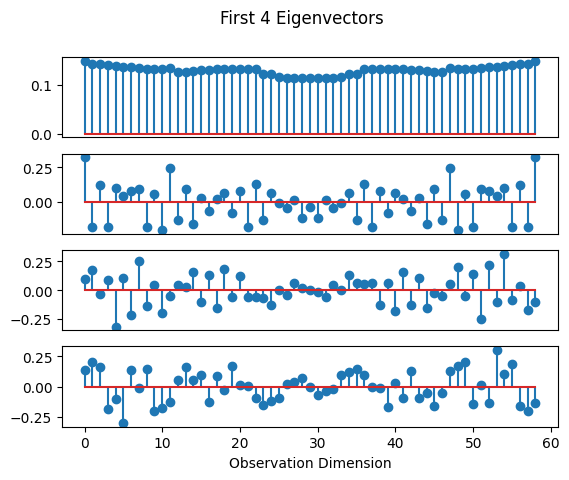

Eigenvalue spectrum

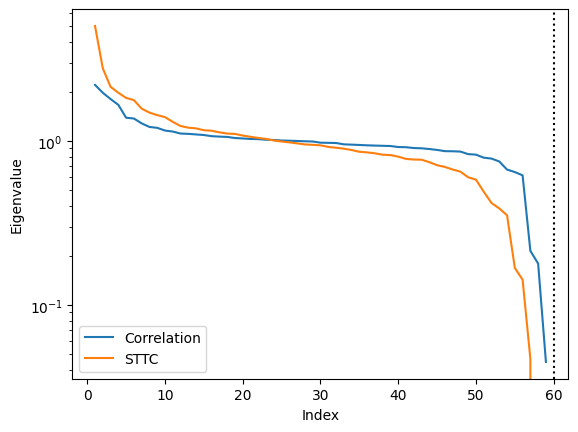

Reconstruction error

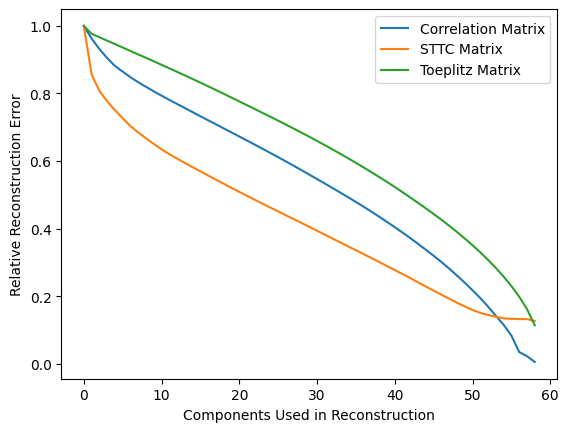

### Egeinvector Layout

Layout for correlation vectors

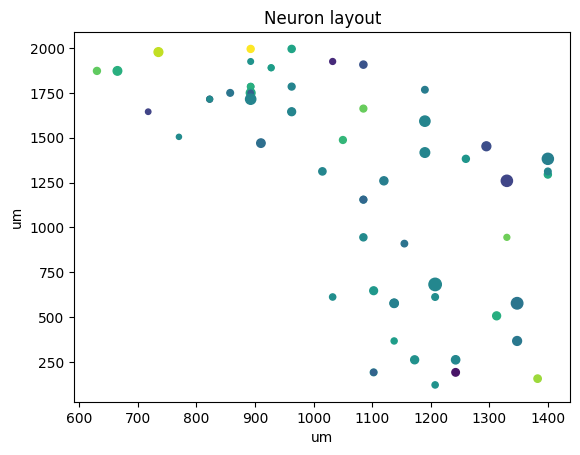 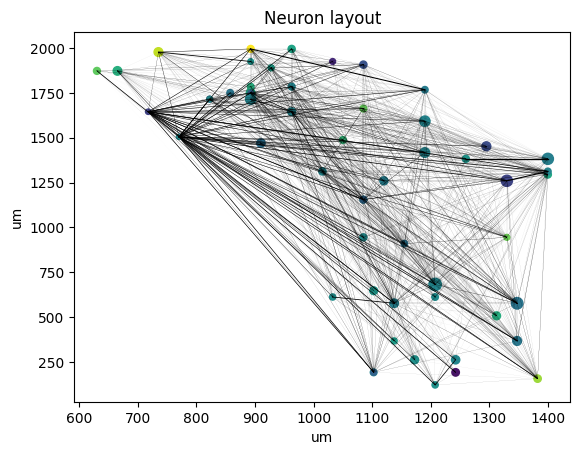

Layout for sttc vectors

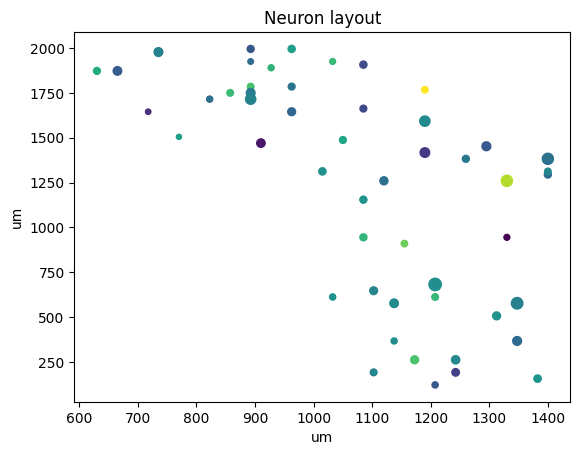 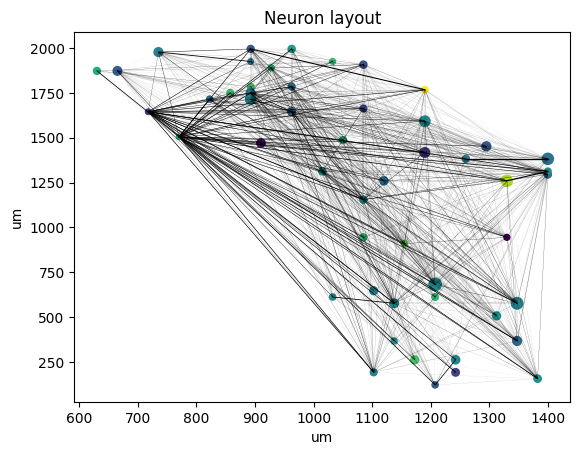

## Data Set 7:

There are 67 neurons in data set 7

The recording is approximately 190.247 seconds long, with a total of 43780 spikes throughout.

The average firing rate for a neuron in the data set is 3.4346551368531197 with a cv of 0.8816773852526482. 

### Spike Rasters

In the final dataset we see undesturbed firing in the neurons right until around 70/73 seconds were we then see a series of periodic haults in activity up until the recording, it is worth noting it seems that the disturbance loses "strength" as time progresses, affecting less and less neurons and llasting a shorter time, this is also shown in the analysis plot.

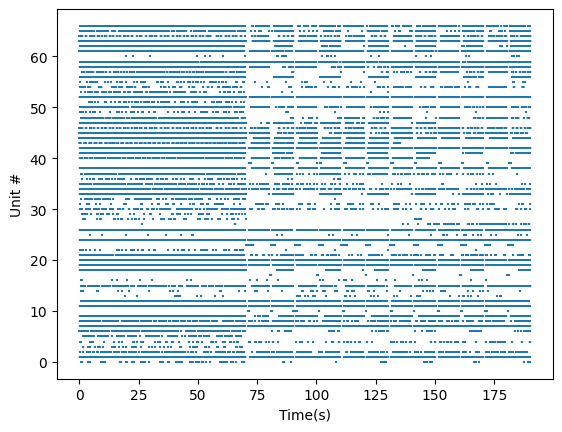
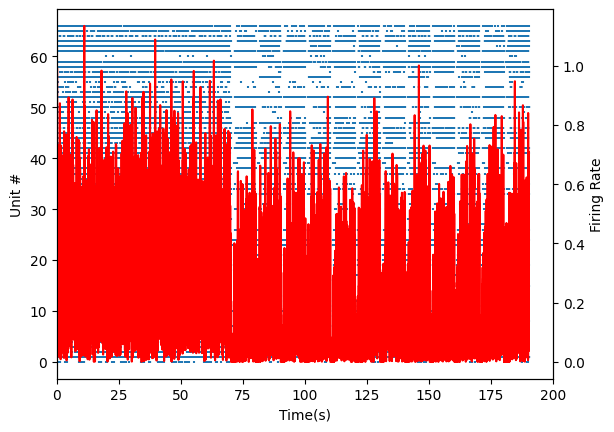
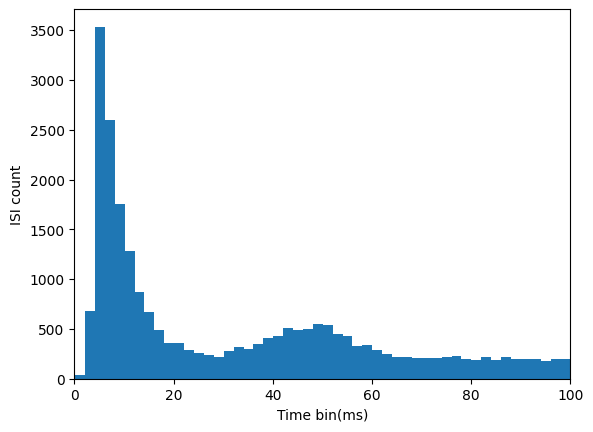

### Correlation and STTC matrices

Correlation matrix

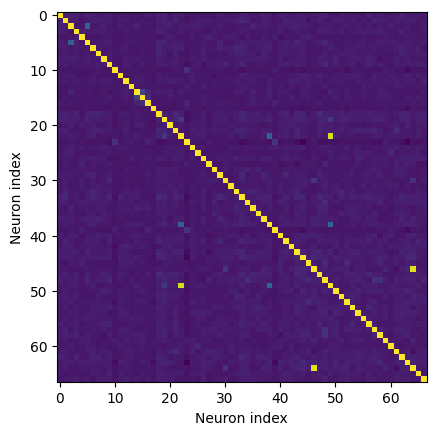

STTC matrix

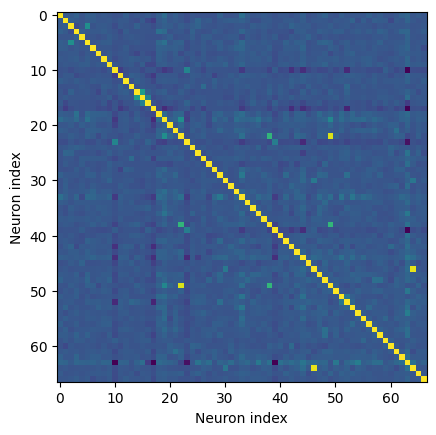

### Neuron Layout

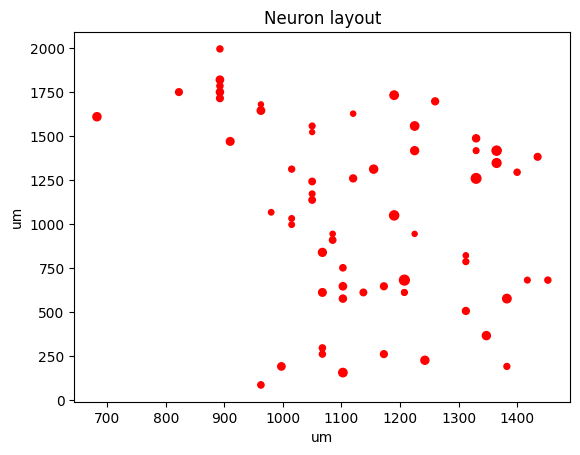

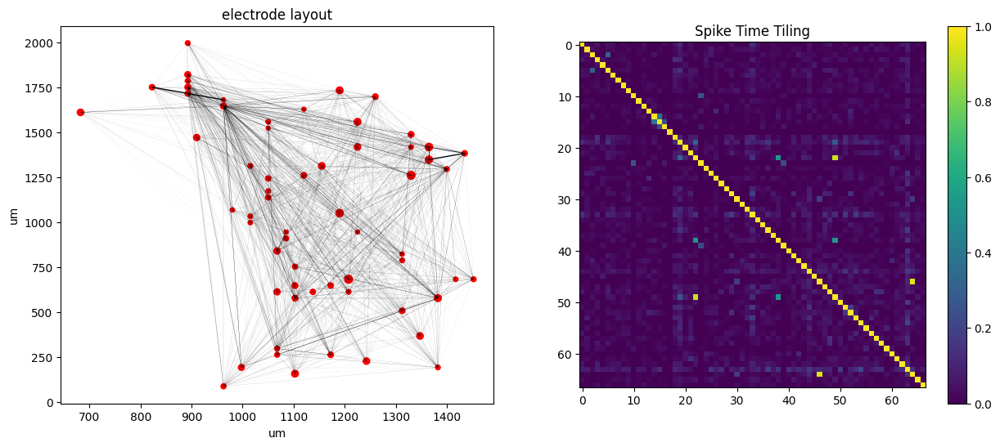

### Egeinvector Analysis

Eigenvectors of the correlation matrix

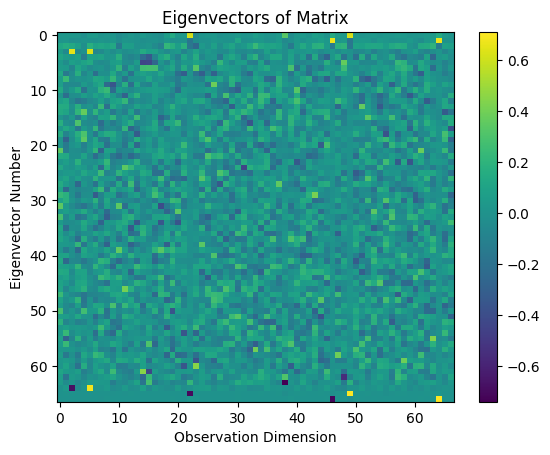

Eigenvectors of the STTC matrix

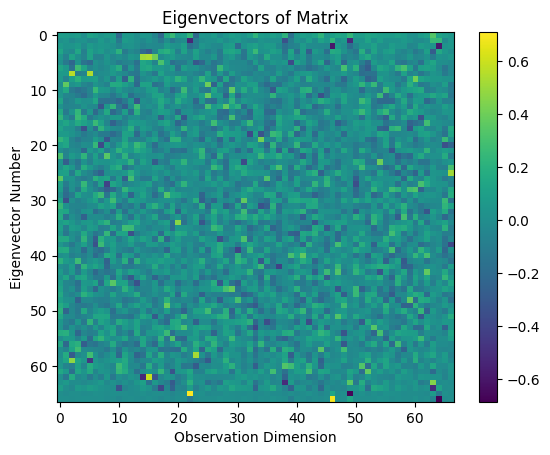

Eigenvectors of the toeplitz matrix

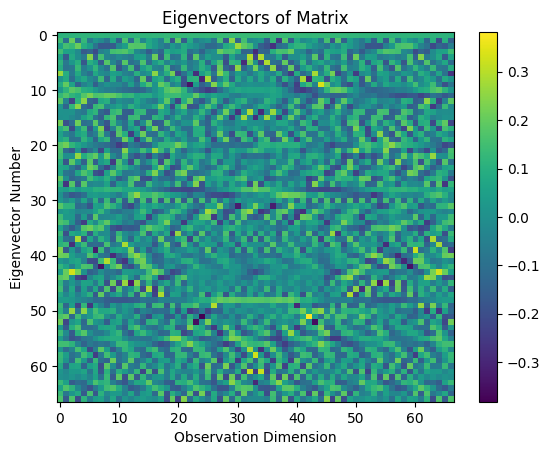

First four eigenvectors of the correlation matrix

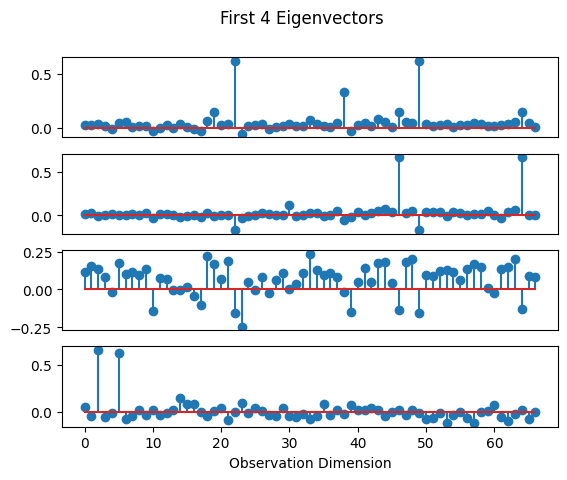

First four eigenvectors of the sttc matrix

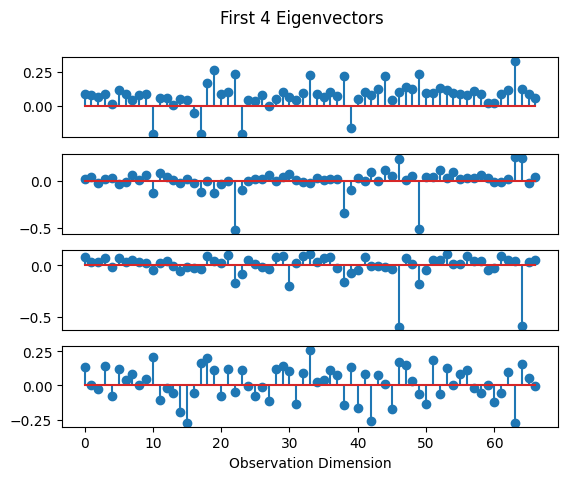

First four eigenvectors of the toeplitz matrix

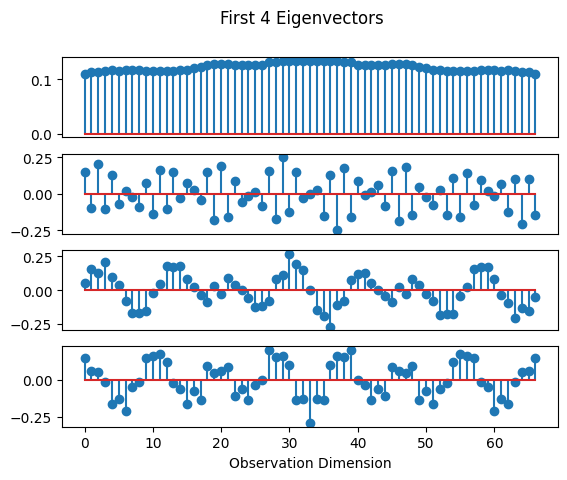

Eigenvalue spectrum

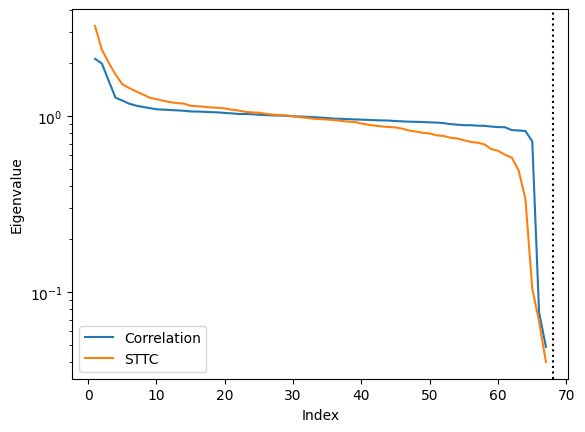

Reconstruction error

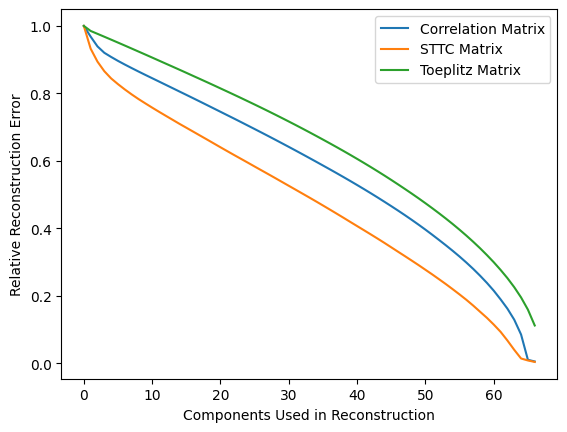

### Egeinvector Layout

Layout for correlation vectors

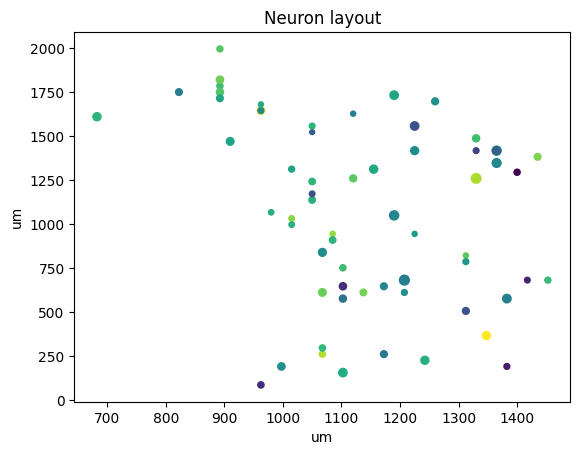 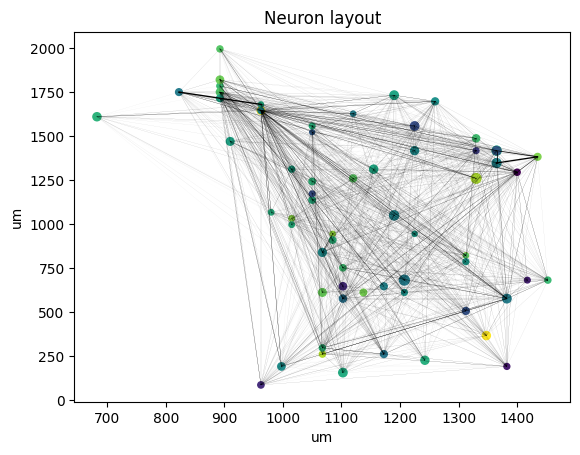

Layout for sttc vectors

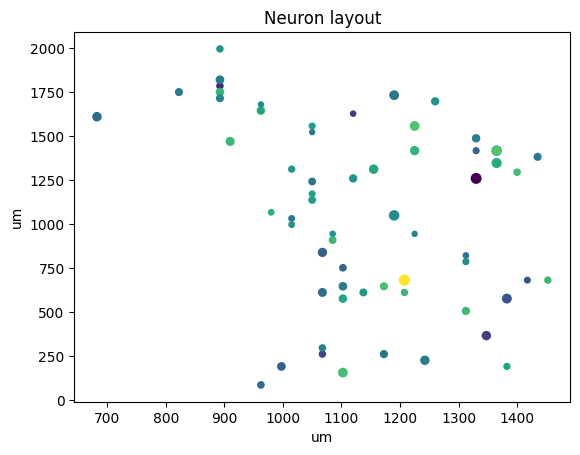 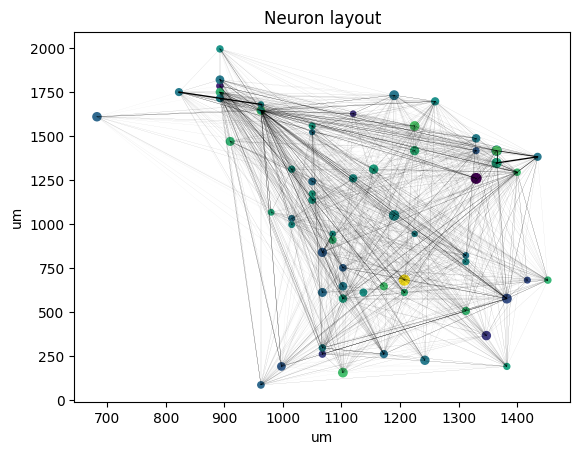

## Mouse Organoid Data

data_before plotted with correlation vectors

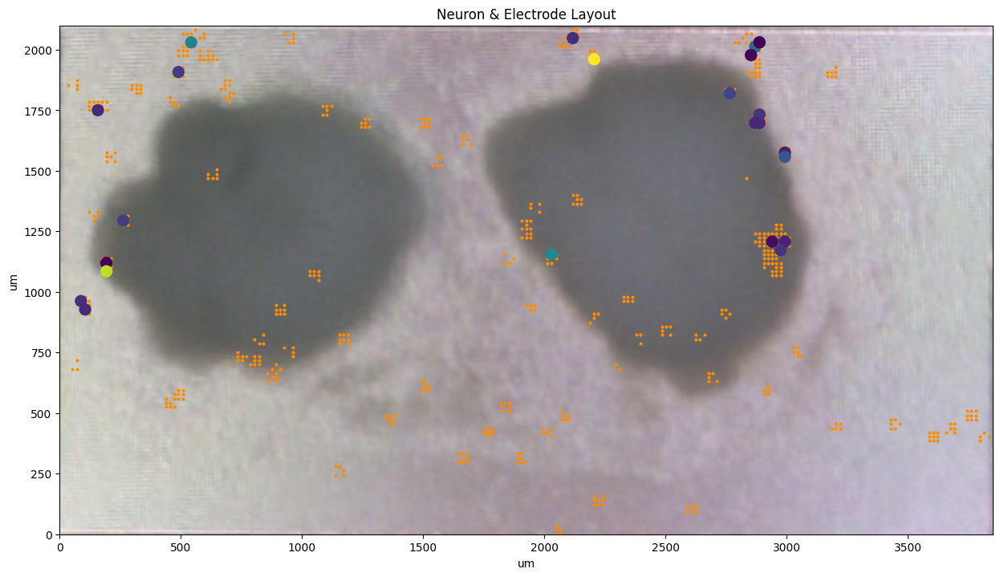

data_before plotted with sttc vectors

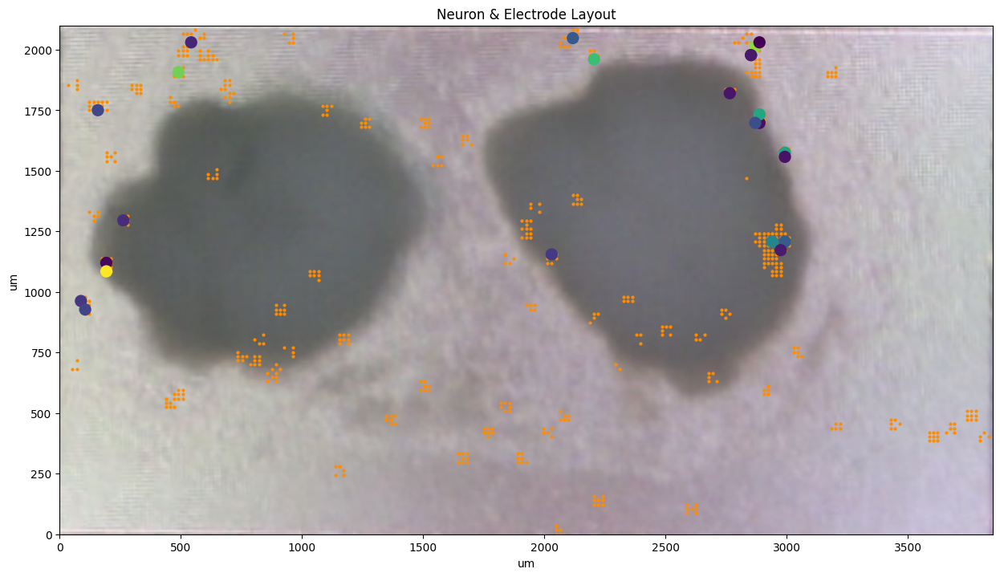

data_before plotted with toeplitz vectors

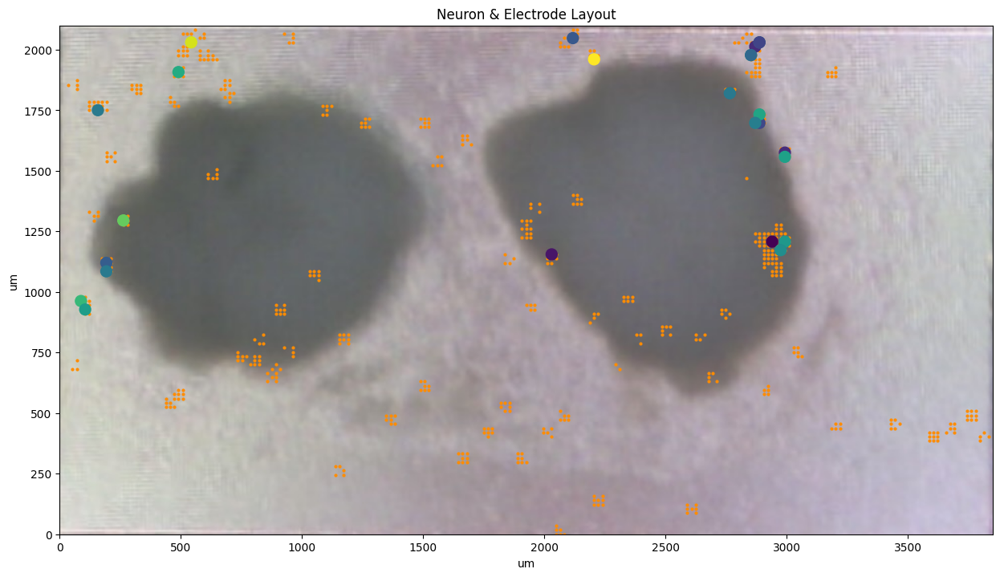

data_after plotted with correlation vectors

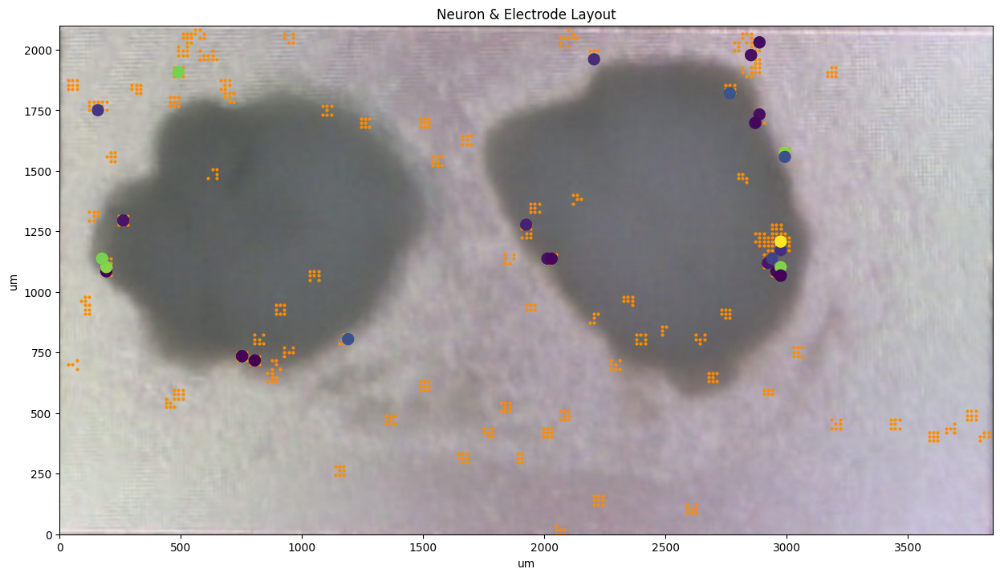

data_after plotted with sttc vectors

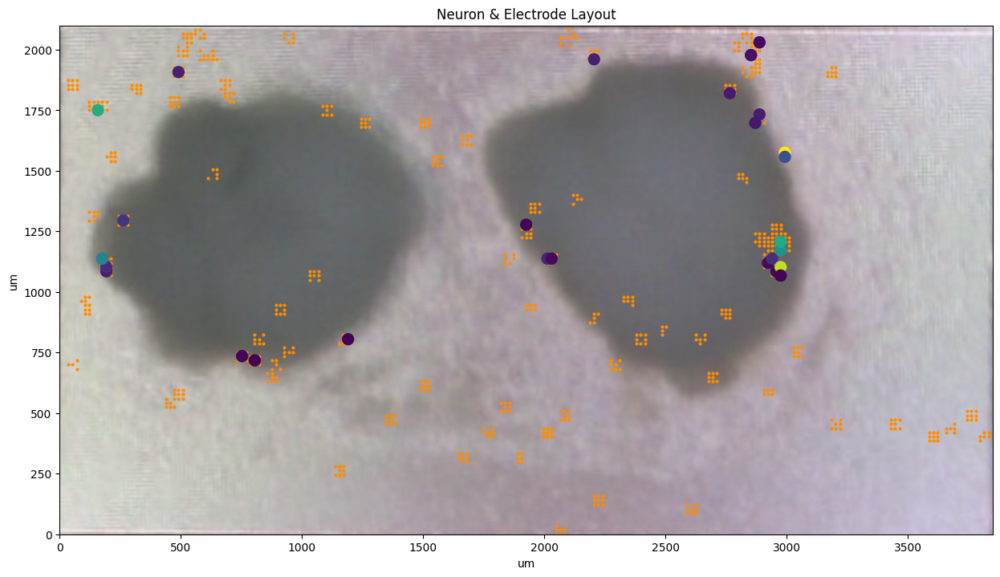

data_after plotted with toeplitz vectors

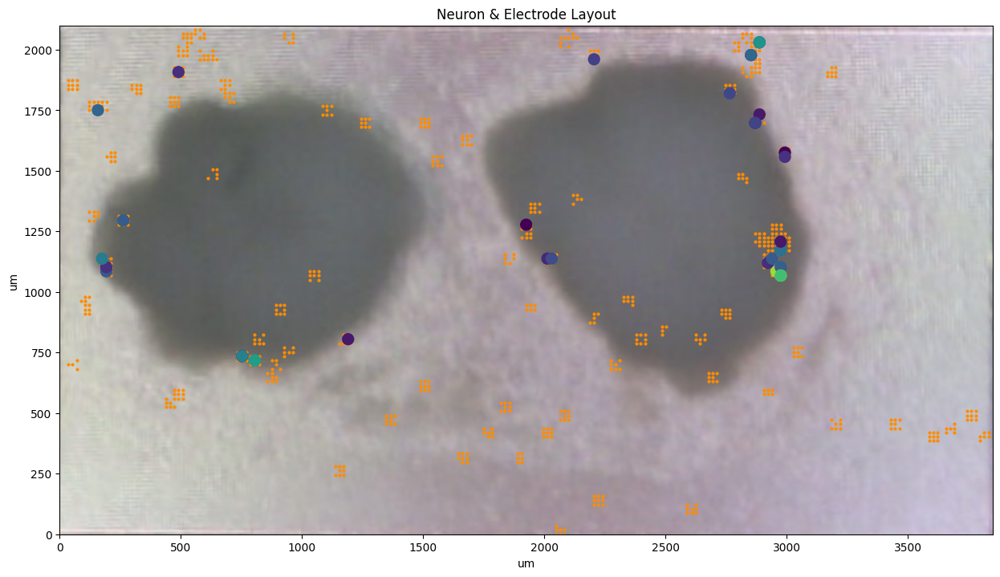